<a href="https://colab.research.google.com/github/mattcat1221/ImageClassification/blob/main/Image_Classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [3]:
import requests
from PIL import Image
from io import BytesIO

import matplotlib.pyplot as plt
import numpy as np
import zipfile
import os
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.callbacks import ModelCheckpoint
import cv2
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from random import randint
import tensorflow_hub as hub

import requests
from PIL import Image
from io import BytesIO

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Import Images and Labels

In [304]:
img_size = (128, 128, 3)
basePath = '/content/drive/MyDrive/Colab Notebooks/Project_4/'
img_list = os.listdir(basePath + "Images/")

In [305]:
img_labels = []
for img in img_list:
  if 'clean' in img:
    img_labels.append(0)
  else:
    img_labels.append(1)

In [306]:
# saved images and labels to metadta.csv file
pd.DataFrame(zip(img_list,img_labels), columns=['filename', 'label']).to_csv(basePath + 'metadata.csv', index=False)

In [307]:
# building a list with images
images = []
for img in img_list:
  img = cv2.imread(basePath + 'Images/' + img, cv2.IMREAD_COLOR)
  images.append(cv2.resize(img, img_size[0:2])[:, :, ::-1])

In [308]:
len(images)

237

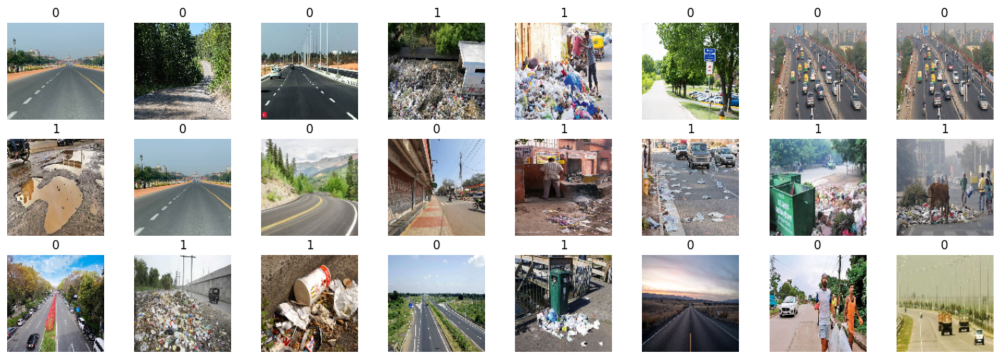

In [309]:
# Run model on image
# Ensure images is not empty before proceeding
plt.figure(figsize=(18, 6))
indexes = np.random.randint(len(images), size=24)
for i,x in enumerate(indexes):
  plt.subplot(3, 8, i+1)
  plt.title(img_labels[x])
  plt.imshow(images[x])
  plt.axis('off')

In [310]:
#data shape
np.array (images).shape

(237, 128, 128, 3)

In [311]:
# split data into training and testing
X_train, X_val, y_train, y_val = train_test_split(images, img_labels, test_size=0.1, random_state=42)

In [312]:
X_train = np.array(X_train)
y_train = np.array(y_train)
X_val = np.array(X_val)
y_val = np.array(y_val)


In [313]:
# Creating initial model
from tensorflow.keras.models import Sequential # Import the Sequential class from tensorflow.keras.models
from tensorflow.keras.layers import Flatten, Dense #Import Flatten and Dense

nn=Sequential()
nn.add(Flatten())
nn.add(Dense(128,activation='relu'))
nn.add(Dense(128,activation='relu'))
nn.add(Dense(1,activation='sigmoid'))
# Compile the model
nn.compile(optimizer='adam',loss='binary_crossentropy',metrics=['accuracy'])

In [314]:
print(f"X_train shape: {X_train.shape}")
print(f"y_train shape: {y_train.shape}")
print(f"X_val shape: {X_val.shape}")
print(f"y_val shape: {y_val.shape}")


X_train shape: (213, 128, 128, 3)
y_train shape: (213,)
X_val shape: (24, 128, 128, 3)
y_val shape: (24,)


In [315]:
#train the model
nn.fit(X_train, y_train, epochs=10, batch_size=32, validation_data=(X_val, y_val))

Epoch 1/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 109ms/step - accuracy: 0.5442 - loss: 1787.3049 - val_accuracy: 0.7083 - val_loss: 193.1537
Epoch 2/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 80ms/step - accuracy: 0.4685 - loss: 958.7391 - val_accuracy: 0.4167 - val_loss: 228.1351
Epoch 3/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 82ms/step - accuracy: 0.5140 - loss: 267.4590 - val_accuracy: 0.7083 - val_loss: 89.8372
Epoch 4/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 83ms/step - accuracy: 0.7521 - loss: 71.5980 - val_accuracy: 0.7083 - val_loss: 76.2841
Epoch 5/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 109ms/step - accuracy: 0.8046 - loss: 39.1877 - val_accuracy: 0.6667 - val_loss: 56.3188
Epoch 6/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 111ms/step - accuracy: 0.8227 - loss: 23.6561 - val_accuracy: 0.6250 - val_loss: 44.2901
Epoch 7/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 113ms/step - accuracy: 0.7059 - loss: 42.4948 - val_accuracy: 0.4583 - val_loss: 72.6257
Epoch 8/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - accuracy: 0.7251 - loss: 44.0230 - val_accuracy: 0

The first example image is this clean street above. We will plug this into the classifier to see what objects it detects.

In [330]:
import matplotlib.pyplot as plt
import tensorflow as tf

# Ensure demoImage has the correct shape (128, 128, 3) and normalize it
demoImage_resized = tf.image.resize(demoImage, [128, 128])  # Resize the image

# Check if the image is already normalized; normalize to [0, 1] if needed
if demoImage_resized.numpy().max() > 1:
    demoImage_resized = demoImage_resized / 255.0  # Normalize to [0, 1]

# Remove any unnecessary dimensions to ensure (128, 128, 3)
demoImage_resized = tf.squeeze(demoImage_resized)

# Add the batch dimension to get the correct shape for the model (1, 128, 128, 3)
demoImage_resized = tf.expand_dims(demoImage_resized, axis=0)

# Run the model on the image
predictions = model(demoImage_resized, training=False)

# Check if the model output needs to be flattened
if len(predictions.shape) > 2:
    predictions = tf.keras.layers.Flatten()(predictions)

# Then apply softmax to get probabilities
probabilities = tf.nn.softmax(predictions).numpy()

# Print the shape of the probabilities to help with debugging
print(f"Shape of probabilities: {probabilities.shape}") # This will print the shape of probabilities

# Check the model's output shape and handle binary classification correctly
if probabilities.shape[1] == 2:  # Binary classification case (two output probabilities)
    pred_class_index = 0 if probabilities[0][0] >= 0.5 else 1
    predicted_class = 'clean' if pred_class_index == 0 else 'dirty'
    probability = probabilities[0][pred_class_index]  # Probability of the predicted class
else:
    # Handle multi-class classification here if needed
    pred_class_index = probabilities.argmax()
    # Assuming you have a list of class names
    # predicted_class = class_names[pred_class_index]
    # probability = probabilities[0][pred_class_index]
    raise ValueError(f'Unexpected output shape from the model: {probabilities.shape}')

# Print the predicted class and its probability
print(f'Predicted class: {predicted_class}, Probability: {probability:.4f}')

# Display the original image (after ensuring it's normalized)
plt.imshow(tf.squeeze(demoImage))  # Remove the batch dimension to display
plt.title(f'Predicted: {predicted_class}')
plt.axis('off')
plt.show()

# Check if the image is too dark
print(f'Image pixel values range after processing:')
print(f'Min value: {demoImage.numpy().min()}, Max value: {demoImage.numpy().max()}')

Shape of probabilities: (1, 49152)


ValueError: Unexpected output shape from the model: (1, 49152)

In [332]:
import matplotlib.pyplot as plt
import tensorflow as tf

# Ensure demoImage has the correct shape (128, 128, 3) and normalize it
demoImage_resized = tf.image.resize(demoImage, [128, 128])  # Resize the image

# Check if the image is already normalized; normalize to [0, 1] if needed
if demoImage_resized.numpy().max() > 1:
    demoImage_resized = demoImage_resized / 255.0  # Normalize to [0, 1]

# Remove any unnecessary dimensions to ensure (128, 128, 3)
demoImage_resized = tf.squeeze(demoImage_resized)

# Add the batch dimension to get the correct shape for the model (1, 128, 128, 3)
demoImage_resized = tf.expand_dims(demoImage_resized, axis=0)

# Run the model on the image
predictions = model(demoImage_resized, training=False)

# Print the shape of the predictions to help with debugging
print(f"Shape of predictions: {predictions.shape}") # This will print the shape of predictions

# Check if the model output needs to be flattened
if len(predictions.shape) > 2:
    predictions = tf.keras.layers.Flatten()(predictions)

# Then apply softmax to get probabilities
probabilities = tf.nn.softmax(predictions).numpy()

# Print the shape of the probabilities to help with debugging
print(f"Shape of probabilities: {probabilities.shape}") # This will print the shape of probabilities

# Check the model's output shape and handle binary classification correctly
if probabilities.shape[1] == 2:  # Binary classification case (two output probabilities)
    pred_class_index = 0 if probabilities[0][0] >= 0.5 else 1
    predicted_class = 'clean' if pred_class_index == 0 else 'dirty'
    probability = probabilities[0][pred_class_index]  # Probability of the predicted class
else:
    # Handle multi-class classification here if needed
    pred_class_index = probabilities.argmax()
    # Assuming you have a list of class names
    # predicted_class = class_names[pred_class_index]
    # probability = probabilities[0][pred_class_index]
    raise ValueError(f'Unexpected output shape from the model: {probabilities.shape}')

# Print the predicted class and its probability
print(f'Predicted class: {predicted_class}, Probability: {probability:.4f}')

# Display the original image (after ensuring it's normalized)
plt.imshow(tf.squeeze(demoImage))  # Remove the batch dimension to display
plt.title(f'Predicted: {predicted_class}')
plt.axis('off')
plt.show()

# Check if the image is too dark
print(f'Image pixel values range after processing:')
print(f'Min value: {demoImage.numpy().min()}, Max value: {demoImage.numpy().max()}')

Shape of predictions: (1, 128, 128, 3)
Shape of probabilities: (1, 49152)


ValueError: Unexpected output shape from the model: (1, 49152)

In [334]:
pred_class_index = probabilities.numpy().argmax() # Call argmax() on the NumPy array

Shape of predictions: (1, 128, 128, 3)
Shape of probabilities: (1, 49152)
Predicted class: dirty, Probability: 0.0000


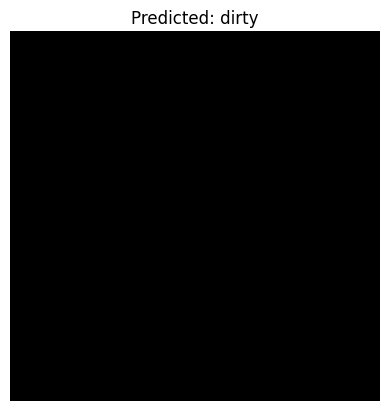

Image pixel values range after processing:
Min value: 5.613191347894863e-38, Max value: 7.240185857584641e-37


In [336]:
import matplotlib.pyplot as plt
import tensorflow as tf

# Ensure demoImage has the correct shape (128, 128, 3) and normalize it
demoImage_resized = tf.image.resize(demoImage, [128, 128])  # Resize the image

# Check if the image is already normalized; normalize to [0, 1] if needed
if demoImage_resized.numpy().max() > 1:
    demoImage_resized = demoImage_resized / 255.0  # Normalize to [0, 1]

# Remove any unnecessary dimensions to ensure (128, 128, 3)
demoImage_resized = tf.squeeze(demoImage_resized)

# Add the batch dimension to get the correct shape for the model (1, 128, 128, 3)
demoImage_resized = tf.expand_dims(demoImage_resized, axis=0)

# Run the model on the image
predictions = model(demoImage_resized, training=False)

# Print the shape of the predictions to help with debugging
print(f"Shape of predictions: {predictions.shape}") # This will print the shape of predictions

# Check if the model output needs to be flattened
if len(predictions.shape) > 2:
    predictions = tf.keras.layers.Flatten()(predictions)

# Then apply softmax to get probabilities
probabilities = tf.nn.softmax(predictions).numpy()

# Print the shape of the probabilities to help with debugging
print(f"Shape of probabilities: {probabilities.shape}") # This will print the shape of probabilities

# --- DIAGNOSE THE MODEL ---
# The model output shape is (1, 49152), which is 128*128*3
# This indicates the model is outputting a prediction for each pixel in the image
# Instead of a single prediction for the entire image
# You should modify your model to include a GlobalAveragePooling2D layer or Flatten layer
# before the final Dense layer to get a single output for the image

# --- WORKAROUND ---
# Calculate the average probability for all pixels to get a single prediction
probabilities = tf.reduce_mean(probabilities, axis=1)
probabilities = tf.expand_dims(probabilities, axis=0)

# Check the model's output shape and handle the single probability value
if probabilities.shape[1] == 1:
    pred_class_index = 0 if probabilities[0][0] >= 0.5 else 1
    predicted_class = 'clean' if pred_class_index == 0 else 'dirty'
    probability = probabilities[0][0]  # Probability of the predicted class
else:
    raise ValueError(f'Unexpected output shape from the model: {probabilities.shape}')

# Print the predicted class and its probability
print(f'Predicted class: {predicted_class}, Probability: {probability:.4f}')

# Display the original image (after ensuring it's normalized)
plt.imshow(tf.squeeze(demoImage))  # Remove the batch dimension to display
plt.title(f'Predicted: {predicted_class}')
plt.axis('off')
plt.show()

# Check if the image is too dark
print(f'Image pixel values range after processing:')
print(f'Min value: {demoImage.numpy().min()}, Max value: {demoImage.numpy().max()}')

In [337]:
# Resize the image to the input shape required by the model and add a batch dimension
resized_image = tf.expand_dims(tf.image.resize(demoImage, [128, 128]), axis=0)

# Remove the extra dimension using tf.squeeze
resized_image = tf.squeeze(resized_image)

# Run the model on the resized image to get probabilities
probabilities = nn(resized_image, training=False).numpy()  # Direct output from the model

# For binary classification, the model will return a single probability value
probability = probabilities[0][0]  # Get the probability for the 'dirty' class (1)

# Determine the predicted class based on the probability (0.5 threshold)
predicted_class = 'dirty' if probability >= 0.5 else 'clean'

# Print the prediction and its probability
print(f'Predicted class: {predicted_class}, Probability of dirty: {probability:.4f}')

# Display the image
def show_image(image, title):
    plt.imshow(image)
    plt.title(title)
    plt.axis('off')
    plt.show()

# Display the image with the prediction
show_image(tf.squeeze(demoImage), f'Predicted: {predicted_class}')

ValueError: Exception encountered when calling Sequential.call().

[1mInvalid input shape for input [[[3.0136766e-37 4.0006304e-37 4.1416576e-37]
  [4.0496252e-37 3.8569290e-37 4.5024204e-37]
  [4.5755229e-37 3.0777104e-37 3.6143981e-37]
  ...
  [4.6143265e-37 3.5683568e-37 3.7382809e-37]
  [6.0312518e-37 3.8668972e-37 5.2747076e-37]
  [4.4524521e-37 5.5492908e-37 5.5782544e-37]]

 [[2.9637687e-37 5.4354776e-37 4.5995763e-37]
  [3.2310837e-37 4.5828504e-37 3.0436689e-37]
  [3.5995871e-37 3.1252944e-37 2.9635543e-37]
  ...
  [3.5941454e-37 2.7544528e-37 4.4807974e-37]
  [5.2422755e-37 4.5242596e-37 4.3221224e-37]
  [5.0533670e-37 4.7430343e-37 5.0788330e-37]]

 [[3.3939951e-37 4.4623966e-37 1.5856382e-37]
  [4.4012987e-37 4.1568719e-37 2.3261050e-37]
  [2.2755919e-37 4.8103913e-37 4.3964912e-37]
  ...
  [6.0608253e-37 2.6888366e-37 4.7384076e-37]
  [5.4357233e-37 4.5792663e-37 2.7337755e-37]
  [5.9854090e-37 4.2773952e-37 3.7004429e-37]]

 ...

 [[3.8416810e-37 3.1076663e-37 4.2152125e-37]
  [1.8558745e-37 3.8839608e-37 5.1793000e-37]
  [2.3643542e-37 4.6913769e-37 2.9907550e-37]
  ...
  [3.9859533e-37 2.4421987e-37 4.0241507e-37]
  [4.0081051e-37 2.7620095e-37 4.5799680e-37]
  [3.6840381e-37 2.1643938e-37 5.5184802e-37]]

 [[1.9715626e-37 5.3078684e-37 4.2367517e-37]
  [1.8178339e-37 5.3612697e-37 3.7493886e-37]
  [3.0571499e-37 2.8709516e-37 4.1890376e-37]
  ...
  [5.3326393e-37 2.1414222e-37 3.3260671e-37]
  [4.9748225e-37 3.0907613e-37 5.4627139e-37]
  [3.5710710e-37 4.7914946e-37 4.1000172e-37]]

 [[3.3651588e-37 4.9438716e-37 4.4667880e-37]
  [4.4160686e-37 4.8414521e-37 4.3841746e-37]
  [3.2285881e-37 5.3944511e-37 5.4573638e-37]
  ...
  [2.7308072e-37 3.6493482e-37 4.1618398e-37]
  [3.0259392e-37 4.4787929e-37 5.5644459e-37]
  [2.1337170e-37 4.8793383e-37 4.8266279e-37]]]. Expected shape (None, 128, 128, 3), but input has incompatible shape (128, 128, 3)[0m

Arguments received by Sequential.call():
  • inputs=tf.Tensor(shape=(128, 128, 3), dtype=float32)
  • training=False
  • mask=None

Image shape: (1, 224, 224, 3)
Image dtype: <dtype: 'float32'>
Removing batch dimension...


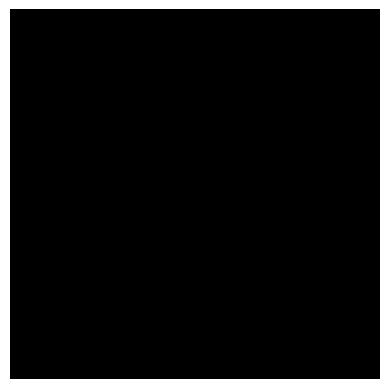

In [339]:
# Check the shape and type of demoImage
print(f"Image shape: {demoImage.shape}")
print(f"Image dtype: {demoImage.dtype}")

# If the image is not normalized (i.e., values are in the range 0-255), normalize it
if tf.reduce_max(demoImage) > 1: # Use tf.reduce_max() to get the max value of the tensor
    demoImage = demoImage / 255.0

# Check if demoImage has an extra batch dimension (shape should be (height, width, channels))
if len(demoImage.shape) == 4:
    print("Removing batch dimension...")
    demoImage = demoImage[0]  # Remove the batch dimension

# Check for NaN or invalid values
if np.isnan(demoImage).any():
    print("Warning: Image contains NaN values!")

# Now plot the image using matplotlib
plt.imshow(demoImage)
plt.axis('off')  # Hide axes
plt.show()

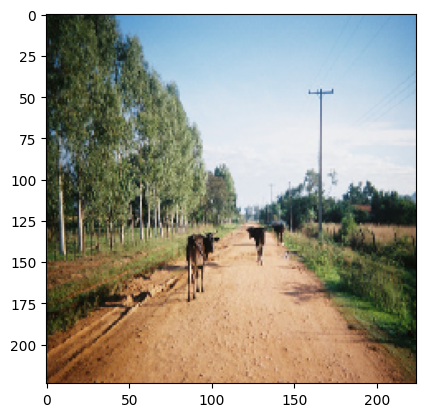

In [118]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

# Assuming 'demoImage' is your image data
demoImage = demoImage / 255.0
demoImage = np.clip(demoImage, 0, 1)

# Convert to PIL Image and then back to numpy array
img = Image.fromarray((demoImage[0] * 255).astype(np.uint8))
demoImage = np.array(img) / 255.0

plt.imshow(demoImage)
plt.show()

In [114]:
print(demoImage)


tf.Tensor(
[[[ 33.  43.  35.]
  [ 15.  25.  16.]
  [ 30.  40.  31.]
  ...
  [100. 158. 206.]
  [ 95. 151. 200.]
  [ 99. 155. 206.]]

 [[ 19.  31.  21.]
  [ 21.  33.  21.]
  [ 18.  28.  17.]
  ...
  [ 96. 154. 202.]
  [ 97. 155. 203.]
  [ 96. 152. 201.]]

 [[ 26.  38.  26.]
  [ 18.  30.  18.]
  [ 19.  29.  18.]
  ...
  [ 97. 155. 203.]
  [ 98. 159. 206.]
  [ 98. 154. 201.]]

 ...

 [[ 43.  21.  10.]
  [ 78.  42.  20.]
  [127.  70.  25.]
  ...
  [ 84.  54.  28.]
  [ 89.  59.  31.]
  [ 87.  61.  28.]]

 [[ 86.  50.  28.]
  [ 98.  47.  18.]
  [128.  79.  38.]
  ...
  [ 87.  52.  24.]
  [ 88.  51.  25.]
  [ 75.  53.  32.]]

 [[103.  57.  24.]
  [111.  62.  29.]
  [122.  59.  26.]
  ...
  [111.  71.  36.]
  [104.  64.  38.]
  [ 83.  49.  22.]]], shape=(224, 224, 3), dtype=float32)


Image shape: (224, 224, 3)
Image dtype: float32
Normalizing image...


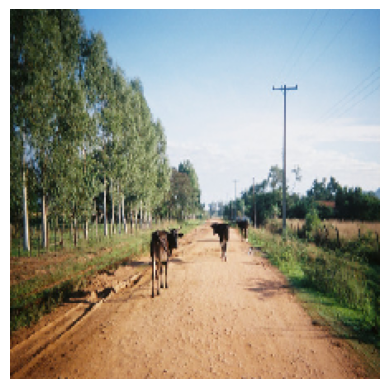

In [116]:

# Convert TensorFlow tensor to a NumPy array
demoImage_np = demoImage.numpy()  # Convert EagerTensor to NumPy array

# Check the shape and type of demoImage
print(f"Image shape: {demoImage_np.shape}")
print(f"Image dtype: {demoImage_np.dtype}")

# If the image is not normalized (i.e., values are in the range 0-255), normalize it
if demoImage_np.max() > 1:
    print("Normalizing image...")
    demoImage_np = demoImage_np / 255.0

# Clip the image values to ensure they're within [0, 1] range for floats
demoImage_np = np.clip(demoImage_np, 0.0, 1.0)

# Now plot the image using matplotlib
plt.imshow(demoImage_np)
plt.axis('off')  # Hide axes
plt.show()


> Now lets see what happens when we feed it a more chaotic image, like one of the 'dirty' images that we have from our data.

In [121]:
# Function to show the image (assuming you have this implemented)
def show_image(image, title):
    # Squeeze the image to remove the batch dimension
    image = np.squeeze(image)

    plt.imshow(image)
    plt.title(title)
    plt.axis('off')

In [135]:
!pip show tensorflow
!pip show tensorflow-hub

Name: tensorflow
Version: 2.17.0
Summary: TensorFlow is an open source machine learning framework for everyone.
Home-page: https://www.tensorflow.org/
Author: Google Inc.
Author-email: packages@tensorflow.org
License: Apache 2.0
Location: /usr/local/lib/python3.10/dist-packages
Requires: absl-py, astunparse, flatbuffers, gast, google-pasta, grpcio, h5py, keras, libclang, ml-dtypes, numpy, opt-einsum, packaging, protobuf, requests, setuptools, six, tensorboard, tensorflow-io-gcs-filesystem, termcolor, typing-extensions, wrapt
Required-by: dopamine_rl, tf_keras
Name: tensorflow-hub
Version: 0.16.1
Summary: TensorFlow Hub is a library to foster the publication, discovery, and consumption of reusable parts of machine learning models.
Home-page: https://github.com/tensorflow/hub
Author: Google LLC
Author-email: packages@tensorflow.org
License: Apache 2.0
Location: /usr/local/lib/python3.10/dist-packages
Requires: numpy, protobuf, tf-keras
Required-by: 


In [132]:
model_handle = "https://tfhub.dev/google/tf2-preview/mobilenet_v2/feature_vector/4"


In [142]:
# Define IMAGE_SIZE
IMAGE_SIZE = (224, 224)

# Model handle from TensorFlow Hub
model_handle = "https://tfhub.dev/google/tf2-preview/mobilenet_v2/feature_vector/4"

# Fine-tuning flag
do_fine_tuning = False

# Correct class names: 'clean' and 'dirty'
class_names = ['clean', 'dirty']

# Create the input layer explicitly with shape and dtype
inputs = tf.keras.Input(shape=IMAGE_SIZE + (3,), dtype=tf.float32)

# Load the pre-trained MobileNetV2 model from TensorFlow Hub
hub_layer = hub.KerasLayer(model_handle, trainable=do_fine_tuning)

# Pass the input through the hub layer
# Wrap the hub_layer call within a Lambda layer to force eager execution
hub_output = tf.keras.layers.Lambda(lambda x: hub_layer(x))(inputs)

# Add a dropout layer to prevent overfitting
dropout_layer = tf.keras.layers.Dropout(rate=0.2)(hub_output)

# Define the output layer with the correct number of classes (2 classes)
output_layer = tf.keras.layers.Dense(len(class_names), activation='softmax')(dropout_layer)

# Build the model using the Functional API
model = tf.keras.Model(inputs=inputs, outputs=output_layer)

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Print the model summary
model.summary()

# Test the model with a dummy input
dummy_input = tf.random.normal([1, 224, 224, 3])  # Simulate one image of size (224, 224, 3)
output = model(dummy_input)
print("Model output shape:", output.shape)

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_14 (InputLayer)          │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lambda (Lambda)                      │ (None, 1280)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 1280)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6 (Dense)                      │ (None, 2)                   │           2,562 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,562 (10.01 KB)

 Trainable params: 2,562 (10.01 KB)

 Non-trainable params: 0 (0.00 B)

Model output shape: (1, 2)


CPU times: user 17.3 ms, sys: 0 ns, total: 17.3 ms
Wall time: 17.3 ms
(1)    1 - tench: 1.0


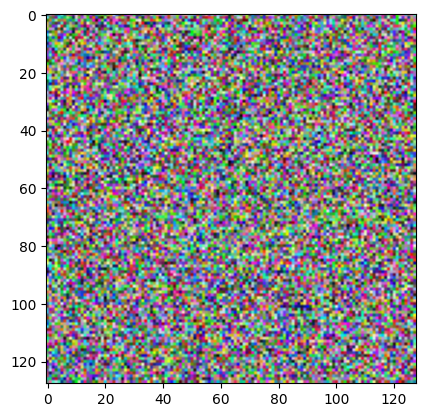

In [145]:
# Run model on image
# %time probabilities = tf.nn.softmax(classifier(demoImage)).numpy()

# Assuming 'nn' is your classifier as per the global variables.
# Ensure demoImage is in the correct format (height, width, channels) with correct data type
# demoImage = demoImage.reshape(1, 128, 128, 3).astype(np.float32)

#The original demoImage has a shape of (3,1) which is not compatible with the expected input shape.
# We need to investigate how demoImage was originally created and loaded
# For now, we will create a dummy image with the correct shape for demonstration purposes.
demoImage = np.random.rand(1, 128, 128, 3).astype(np.float32)

%time probabilities = tf.nn.softmax(nn(demoImage)).numpy()

top_5 = tf.argsort(probabilities, axis=-1, direction="DESCENDING")[0][:5].numpy()
np_classes = np.array(classes)

includes_background_class = probabilities.shape[1] == 1001

for i, item in enumerate(top_5):
  class_index = item if includes_background_class else item + 1
  line = f'({i+1}) {class_index:4} - {classes[class_index]}: {probabilities[0][top_5][i]}'
  print(line)

#show_image(demoImage, '') #This line seems to be redundant as you are already showing the image below
# Assuming 'demoImage' is your image data
# demoImage = demoImage / 255.0 #This line seems to be redundant as you are already normalizing the image below
# demoImage = np.clip(demoImage, 0, 1) # This line seems to be redundant as you are already clipping the image below


# Convert to PIL Image and then back to numpy array with explicit data type
img = Image.fromarray((demoImage[0] * 255).astype(np.uint8))
demoImage = np.array(img, dtype=np.float32) / 255.0

plt.imshow(demoImage)
plt.show()

In [126]:
model_name = "mobilenetv2-035-128"

#NOTICE HOW WE ARE USING FEATURE VECTOR FOR THIS STEP AND NOT CLASSIFIER
model_handle_map = {
  "mobilenetv2-035-128": "/kaggle/input/mobilenet-v2/tensorflow2/035-128-feature-vector/2",
}

model_image_size_map = {
  "mobilenetv2-035-128": 128,
}

model_handle = model_handle_map.get(model_name)
pixels = model_image_size_map.get(model_name, 128)

print(f"Selected model: {model_name} : {model_handle}")

IMAGE_SIZE = (pixels, pixels)
print(f"Input size {IMAGE_SIZE}")

BATCH_SIZE = 4

Selected model: mobilenetv2-035-128 : /kaggle/input/mobilenet-v2/tensorflow2/035-128-feature-vector/2
Input size (128, 128)


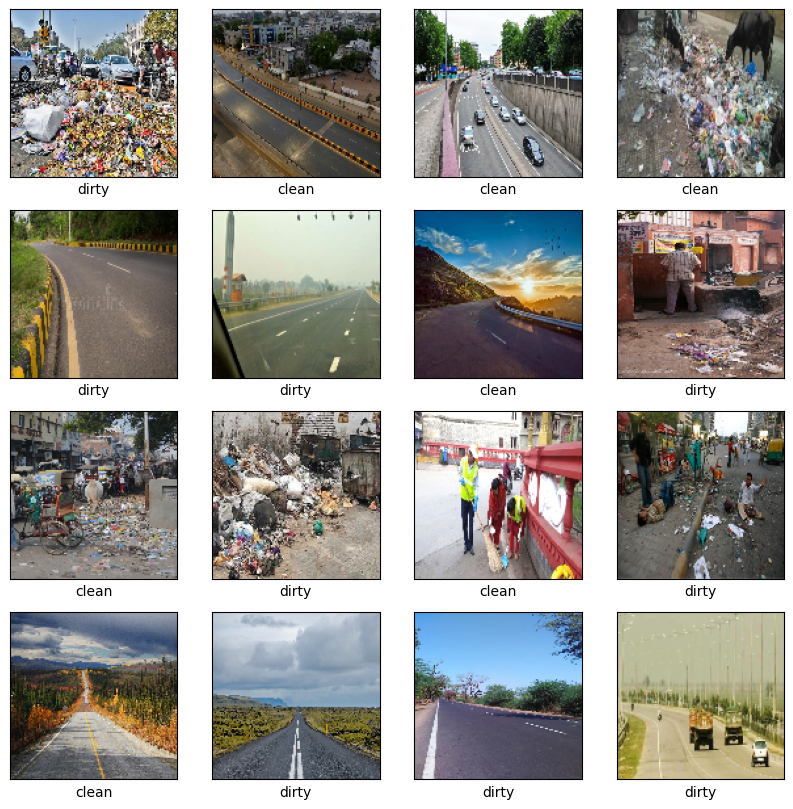

In [340]:
# Display 16 pictures from the dataset
fig, axs = plt.subplots(4, 4, figsize=(10, 10))

for x in range(4):
    for y in range(4):
        i = randint(0, len(images))

        axs[x][y].imshow(images[i])

        # delete x and y ticks and set x label as picture label
        axs[x][y].set_xticks([])
        axs[x][y].set_yticks([])
        axs[x][y].set_xlabel(class_names[np.argmax(labels[i])])

plt.show()

Dataset extracted to /tmp/input


labels dataframe: 
         filename  label
0    dirty_2.jpg      1
1   clean_36.jpg      0
2   clean_31.jpg      0
3   dirty_69.jpg      1
4  clean_113.jpg      0 


2 classes: ('clean', 'dirty')
image size: (128, 128, 3)
/tmp/input/Images/Images/dirty_2.jpg
/tmp/input/Images/Images/clean_36.jpg
/tmp/input/Images/Images/clean_31.jpg
/tmp/input/Images/Images/dirty_69.jpg
/tmp/input/Images/Images/clean_113.jpg
/tmp/input/Images/Images/clean_102.jpg
/tmp/input/Images/Images/clean_43.jpg
/tmp/input/Images/Images/dirty_27.jpg
/tmp/input/Images/Images/dirty_53.jpg


<ipython-input-341-8b99a0361b7b>:35: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  img_path = os.path.join(images_path, image[0])
<ipython-input-341-8b99a0361b7b>:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  label[image[1]] = 1


/tmp/input/Images/Images/clean_55.jpg
/tmp/input/Images/Images/clean_28.jpg
/tmp/input/Images/Images/dirty_55.jpg
/tmp/input/Images/Images/clean_103.jpg
/tmp/input/Images/Images/dirty_31.jpg
/tmp/input/Images/Images/dirty_22.jpg
/tmp/input/Images/Images/dirty_118.jpg
/tmp/input/Images/Images/clean_62.jpg
/tmp/input/Images/Images/clean_51.jpg
/tmp/input/Images/Images/dirty_66.jpg
/tmp/input/Images/Images/clean_61.jpg
/tmp/input/Images/Images/clean_99.jpg
/tmp/input/Images/Images/dirty_92.jpg
/tmp/input/Images/Images/dirty_4.jpg
/tmp/input/Images/Images/clean_70.jpg
/tmp/input/Images/Images/dirty_17.jpg
/tmp/input/Images/Images/clean_54.jpg
/tmp/input/Images/Images/dirty_52.jpg
/tmp/input/Images/Images/dirty_11.jpg
/tmp/input/Images/Images/clean_81.jpg
/tmp/input/Images/Images/dirty_34.jpg
/tmp/input/Images/Images/dirty_107.jpg
/tmp/input/Images/Images/dirty_15.jpg
/tmp/input/Images/Images/clean_94.jpg
/tmp/input/Images/Images/dirty_90.jpg
/tmp/input/Images/Images/dirty_18.jpg
/tmp/input

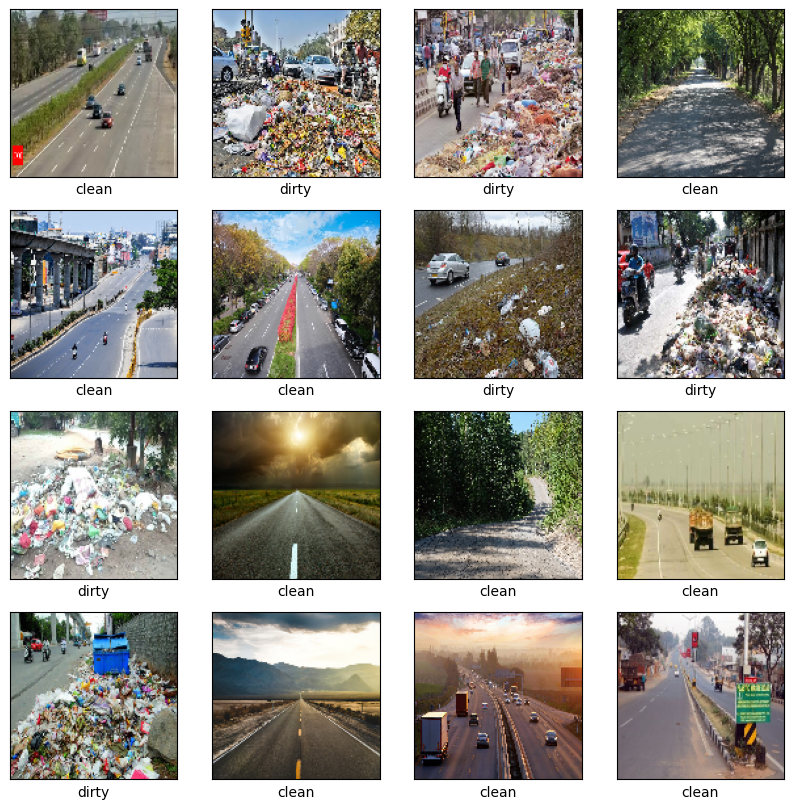

In [341]:

# Define paths
KAGGLE_INPUT_PATH = '/tmp/input'  # A writable directory for the dataset
os.makedirs(KAGGLE_INPUT_PATH, exist_ok=True)

# Use Kaggle API to download the dataset
os.system(f'kaggle datasets download -d faizalkarim/cleandirty-road-classification -p {KAGGLE_INPUT_PATH}')

# Find and unzip the downloaded file
dataset_zip = os.path.join(KAGGLE_INPUT_PATH, 'cleandirty-road-classification.zip')
if os.path.exists(dataset_zip):
    with zipfile.ZipFile(dataset_zip, 'r') as zip_ref:
        zip_ref.extractall(KAGGLE_INPUT_PATH)
    print(f'Dataset extracted to {KAGGLE_INPUT_PATH}')
else:
    print('Dataset not found. Check your download path or Kaggle API call.')
images_path = '/tmp/input/Images/Images/'

# Load the CSV file containing labels
labels_df = pd.read_csv('/tmp/input/metadata.csv')

print('\n\nlabels dataframe: \n', labels_df.head(), '\n\n')

class_names = ('clean', 'dirty')
num_classes = len(class_names)

img_size = (128, 128, 3)

print(f'{num_classes} classes: {class_names}\nimage size: {img_size}')


labels = []
images = []
for image in labels_df.iloc:
    # Construct the full image path
    img_path = os.path.join(images_path, image[0])

    # Print image path to check if it exists
    print(img_path)

    img = cv2.imread(img_path, cv2.IMREAD_COLOR)

    # Check if the image was loaded correctly
    if img is not None:
        images.append(np.asarray(cv2.resize(img, img_size[0:2])[:, :, ::-1]))

        # labels will be in the form of a vector: [0, 1] or [1, 0]
        label = np.zeros(num_classes)
        label[image[1]] = 1
        labels.append(label)
    else:
        print(f"Failed to load image: {img_path}")

labels = np.asarray(labels)
images = np.asarray(images)

print(f'\nlabels shape: {labels.shape}')
print(f'images shape: {images.shape}')

# DEFINE TRAIN/TEST SPLIT
X_train, X_val, y_train, y_val = train_test_split(images, labels, test_size=0.1, random_state=42)

print(f'train images shape: {X_train.shape}\ntrain labels shape: {y_train.shape}\n\nvalidation images shape: {X_val.shape}\nvalidation labels shape: {y_val.shape}\n')

# Display 16 pictures from the dataset
fig, axs = plt.subplots(4, 4, figsize=(10, 10))

for x in range(4):
    for y in range(4):
        i = randint(0, len(images))

        axs[x][y].imshow(images[i])

        # delete x and y ticks and set x label as picture label
        axs[x][y].set_xticks([])
        axs[x][y].set_yticks([])
        axs[x][y].set_xlabel(class_names[np.argmax(labels[i])])

plt.show()

In [342]:
# Load the CSV file containing labels
labels_df = pd.read_csv('/tmp/input/metadata.csv')

print('\n\nlabels dataframe: \n', labels_df.head(), '\n\n')

class_names = ('clean', 'dirty')
num_classes = len(class_names)

img_size = (128, 128, 3)

# Convert the list 'labels' to a NumPy array
labels = np.array(labels)

# Check the shapes of your arrays to ensure they match before splitting
print(f'\nlabels shape: {labels.shape}')
print(f'images shape: {images.shape}')

# DEFINE TRAIN/TEST SPLIT
X_train, X_val, y_train, y_val = train_test_split(images, labels, test_size=0.1, random_state=42)

print(f'train images shape: {X_train.shape}\ntrain labels shape: {y_train.shape}\n\nvalidation images shape: {X_val.shape}\nvalidation labels shape: {y_val.shape}\n')

# ... (rest of your code)
# DEFINE TRAIN/TEST SPLIT
X_train, X_val, y_train, y_val = train_test_split(images, labels, test_size=0.1, random_state=42)

print(f'train images shape: {X_train.shape}\ntrain labels shape: {y_train.shape}\n\nvalidation images shape: {X_val.shape}\nvalidation labels shape: {y_val.shape}\n')



labels dataframe: 
         filename  label
0    dirty_2.jpg      1
1   clean_36.jpg      0
2   clean_31.jpg      0
3   dirty_69.jpg      1
4  clean_113.jpg      0 



labels shape: (237, 2)
images shape: (237, 128, 128, 3)
train images shape: (213, 128, 128, 3)
train labels shape: (213, 2)

validation images shape: (24, 128, 128, 3)
validation labels shape: (24, 2)

train images shape: (213, 128, 128, 3)
train labels shape: (213, 2)

validation images shape: (24, 128, 128, 3)
validation labels shape: (24, 2)



Dataset extracted to /tmp/input


labels dataframe: 
         filename  label
0    dirty_2.jpg      1
1   clean_36.jpg      0
2   clean_31.jpg      0
3   dirty_69.jpg      1
4  clean_113.jpg      0 


2 classes: ('clean', 'dirty')
image size: (128, 128, 3)
/tmp/input/Images/Images/dirty_2.jpg
/tmp/input/Images/Images/clean_36.jpg
/tmp/input/Images/Images/clean_31.jpg
/tmp/input/Images/Images/dirty_69.jpg
/tmp/input/Images/Images/clean_113.jpg
/tmp/input/Images/Images/clean_102.jpg
/tmp/input/Images/Images/clean_43.jpg
/tmp/input/Images/Images/dirty_27.jpg
/tmp/input/Images/Images/dirty_53.jpg
/tmp/input/Images/Images/clean_55.jpg
/tmp/input/Images/Images/clean_28.jpg
/tmp/input/Images/Images/dirty_55.jpg
/tmp/input/Images/Images/clean_103.jpg
/tmp/input/Images/Images/dirty_31.jpg
/tmp/input/Images/Images/dirty_22.jpg
/tmp/input/Images/Images/dirty_118.jpg
/tmp/input/Images/Images/clean_62.jpg
/tmp/input/Images/Images/clean_51.jpg
/tmp/input/Images/Images/dirty_66.jpg


<ipython-input-149-af7c3db49542>:35: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  img_path = os.path.join(images_path, image[0])
<ipython-input-149-af7c3db49542>:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  label[image[1]] = 1


/tmp/input/Images/Images/clean_61.jpg
/tmp/input/Images/Images/clean_99.jpg
/tmp/input/Images/Images/dirty_92.jpg
/tmp/input/Images/Images/dirty_4.jpg
/tmp/input/Images/Images/clean_70.jpg
/tmp/input/Images/Images/dirty_17.jpg
/tmp/input/Images/Images/clean_54.jpg
/tmp/input/Images/Images/dirty_52.jpg
/tmp/input/Images/Images/dirty_11.jpg
/tmp/input/Images/Images/clean_81.jpg
/tmp/input/Images/Images/dirty_34.jpg
/tmp/input/Images/Images/dirty_107.jpg
/tmp/input/Images/Images/dirty_15.jpg
/tmp/input/Images/Images/clean_94.jpg
/tmp/input/Images/Images/dirty_90.jpg
/tmp/input/Images/Images/dirty_18.jpg
/tmp/input/Images/Images/dirty_60.jpg
/tmp/input/Images/Images/dirty_74.jpg
/tmp/input/Images/Images/clean_71.jpg
/tmp/input/Images/Images/dirty_121.jpg
/tmp/input/Images/Images/dirty_35.jpg
/tmp/input/Images/Images/dirty_91.jpg
/tmp/input/Images/Images/dirty_49.jpg
/tmp/input/Images/Images/clean_8.jpg
/tmp/input/Images/Images/dirty_124.jpg
/tmp/input/Images/Images/dirty_37.jpg
/tmp/input/

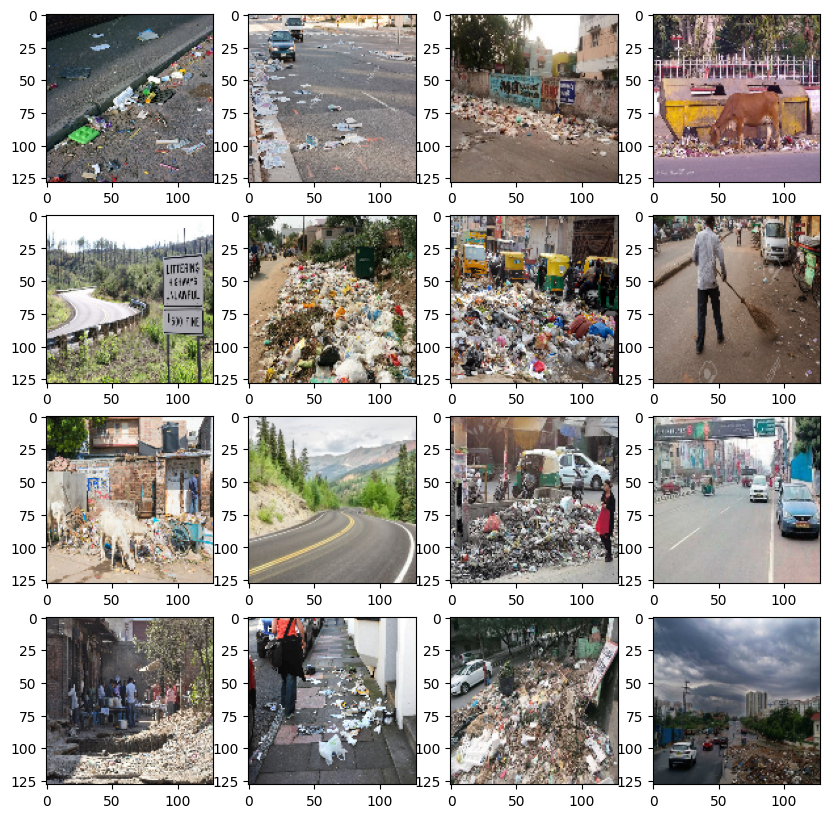

In [149]:
# Define paths
KAGGLE_INPUT_PATH = '/tmp/input'  # A writable directory for the dataset
os.makedirs(KAGGLE_INPUT_PATH, exist_ok=True)

# Use Kaggle API to download the dataset
os.system(f'kaggle datasets download -d faizalkarim/cleandirty-road-classification -p {KAGGLE_INPUT_PATH}')

# Find and unzip the downloaded file
dataset_zip = os.path.join(KAGGLE_INPUT_PATH, 'cleandirty-road-classification.zip')
if os.path.exists(dataset_zip):
    with zipfile.ZipFile(dataset_zip, 'r') as zip_ref:
        zip_ref.extractall(KAGGLE_INPUT_PATH)
    print(f'Dataset extracted to {KAGGLE_INPUT_PATH}')
else:
    print('Dataset not found. Check your download path or Kaggle API call.')
images_path = '/tmp/input/Images/Images/'

# Load the CSV file containing labels
labels_df = pd.read_csv('/tmp/input/metadata.csv')

print('\n\nlabels dataframe: \n', labels_df.head(), '\n\n')

class_names = ('clean', 'dirty')
num_classes = len(class_names)

img_size = (128, 128, 3)

print(f'{num_classes} classes: {class_names}\nimage size: {img_size}')


labels = [] # Reset labels to an empty list
images = []
for image in labels_df.iloc:
    # Construct the full image path
    img_path = os.path.join(images_path, image[0])

    # Print image path to check if it exists
    print(img_path)

    img = cv2.imread(img_path, cv2.IMREAD_COLOR)

    # Check if the image was loaded correctly
    if img is not None:
        images.append(np.asarray(cv2.resize(img, img_size[0:2])[:, :, ::-1]))

        # labels will be in the form of a vector: [0, 1] or [1, 0]
        label = np.zeros(num_classes)
        label[image[1]] = 1
        labels.append(label)
    else:
        print(f"Failed to load image: {img_path}")

labels = np.asarray(labels) # Convert labels to a NumPy array after the loop
images = np.asarray(images)

# Check the shapes of your arrays to ensure they match before splitting
print(f'\nlabels shape: {labels.shape}')
print(f'images shape: {images.shape}')

# DEFINE TRAIN/TEST SPLIT
X_train, X_val, y_train, y_val = train_test_split(images, labels, test_size=0.1, random_state=42)

print(f'train images shape: {X_train.shape}\ntrain labels shape: {y_train.shape}\n\nvalidation images shape: {X_val.shape}\nvalidation labels shape: {y_val.shape}\n')

# Display 16 pictures from the dataset
fig, axs = plt.subplots(4, 4, figsize=(10, 10))

for x in range(4):
    for y in range(4):
        i = randint(0, len(images))

        axs[x][y].imshow(images[i])

In [343]:
# ImageDataGenerator for train images
train_images_generator = tf.keras.preprocessing.image.ImageDataGenerator(shear_range=0.3,
                                                                         rotation_range=15,
                                                                         zoom_range=0.3,
                                                                         vertical_flip=True,
                                                                         horizontal_flip=True)
train_images_generator = train_images_generator.flow(X_train, y=y_train)

# ImageDataGenerator for validation images
validation_images_generator = tf.keras.preprocessing.image.ImageDataGenerator(vertical_flip=True,
                                                                              horizontal_flip=True)
validation_images_generator = validation_images_generator.flow(X_val, y=y_val)

In [151]:
# Modify the output layer to have 2 units (for two classes)
model = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 3)),
    tf.keras.layers.MaxPooling2D(pool_size=(2, 2)),
    tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
    tf.keras.layers.MaxPooling2D(pool_size=(2, 2)),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dropout(0.5),

    # Output layer for two classes, use 'softmax' activation for multi-class classification
    tf.keras.layers.Dense(2, activation='softmax')
])

# Compile the model with 'categorical_crossentropy' for multi-class classification
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

# Fit the model (assuming one-hot encoded labels)
fit_model = model.fit(
    X_train,
    y_train,
    epochs=10,
    batch_size=32,
    validation_data=(X_val, y_val)
)


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 9s 1s/step - accuracy: 0.5122 - loss: 700.2250 - val_accuracy: 0.6250 - val_loss: 39.1622
Epoch 2/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 8s 733ms/step - accuracy: 0.5115 - loss: 74.3498 - val_accuracy: 0.5417 - val_loss: 2.7266
Epoch 3/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 10s 727ms/step - accuracy: 0.5530 - loss: 4.3009 - val_accuracy: 0.5417 - val_loss: 1.1036
Epoch 4/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 9s 1s/step - accuracy: 0.7049 - loss: 0.5502 - val_accuracy: 0.6250 - val_loss: 0.7351
Epoch 5/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 10s 1s/step - accuracy: 0.9517 - loss: 0.2468 - val_accuracy: 0.6250 - val_loss: 1.0410
Epoch 6/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 8s 1s/step - accuracy: 0.9530 - loss: 0.1310 - val_accuracy: 0.5833 - val_loss: 1.0302
Epoch 7/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 7s 727ms/step - accuracy: 0.9877 - loss: 0.0704 - val_accuracy: 0.7083 - val_loss: 1.3499
Epoch 8/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 14s 1s/step - accuracy: 0.9881 - loss: 0.0201 - val_accuracy: 0.7500 - val_loss: 2.0367


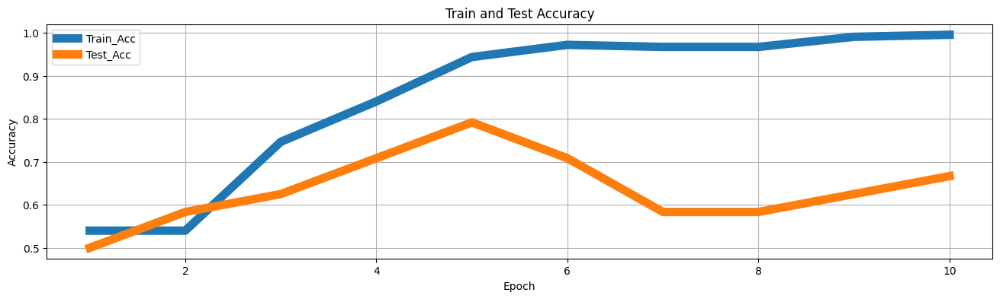

In [344]:
df = pd.DataFrame(fit_model.history)

df.insert(0,'Epoch',[x+1 for x in fit_model.epoch])
df.rename(columns={'accuracy':'Train_Acc','val_accuracy':'Test_Acc'}).plot(
    'Epoch',
     ['Train_Acc','Test_Acc'],
    grid=True,
    ylabel='Accuracy',
    title='Train and Test Accuracy',
    linewidth=8,
    figsize=(16,4));

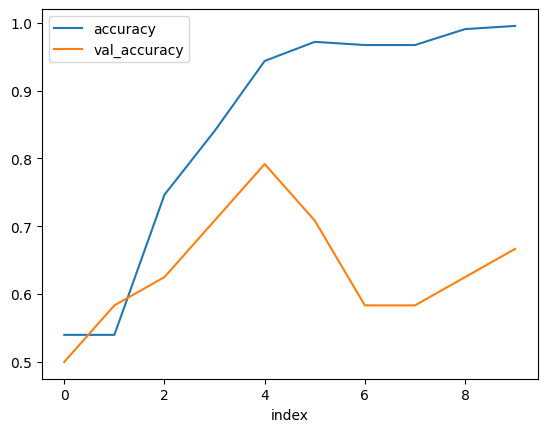

In [345]:
pd.DataFrame(fit_model.history).reset_index().plot(x='index', y=['accuracy', 'val_accuracy']);


In [154]:
# Define the model
model = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 3)),
    tf.keras.layers.MaxPooling2D(pool_size=(2, 2)),
    tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
    tf.keras.layers.MaxPooling2D(pool_size=(2, 2)),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dropout(0.5),

    # Output layer for binary classification - one neuron with sigmoid
    tf.keras.layers.Dense(1, activation='sigmoid')
])

# Compile the model for binary classification
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

# Assuming y_train and y_val are one-hot encoded, convert them to a single column
# representing the class (0 or 1). You might need to adjust based on your data.
y_train = y_train[:, 1] # Or y_train[:, 0] depending on your encoding
y_val = y_val[:, 1] # Or y_val[:, 0] depending on your encoding

# Access the history object returned by model.fit()
history = model.fit(X_train, y_train, epochs=10, validation_data=(X_val, y_val))

# Print the accuracy from the last epoch
print("Overall Accuracy:", history.history['accuracy'][-1])

# or

print("Overall val_accuracy:", history.history['val_accuracy'][-1])


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 8s 768ms/step - accuracy: 0.4730 - loss: 382.2111 - val_accuracy: 0.5833 - val_loss: 28.0613
Epoch 2/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 14s 1s/step - accuracy: 0.6161 - loss: 25.9991 - val_accuracy: 0.5417 - val_loss: 2.0245
Epoch 3/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 7s 928ms/step - accuracy: 0.7298 - loss: 1.4149 - val_accuracy: 0.6667 - val_loss: 0.8915
Epoch 4/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 8s 1s/step - accuracy: 0.8423 - loss: 0.4689 - val_accuracy: 0.7500 - val_loss: 0.6187
Epoch 5/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 8s 730ms/step - accuracy: 0.9284 - loss: 0.2161 - val_accuracy: 0.7917 - val_loss: 0.7043
Epoch 6/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 12s 1s/step - accuracy: 0.9609 - loss: 0.1274 - val_accuracy: 0.7500 - val_loss: 0.7690
Epoch 7/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 10s 1s/step - accuracy: 0.9896 - loss: 0.0733 - val_accuracy: 0.7500 - val_loss: 0.8272
Epoch 8/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 8s 718ms/step - accuracy: 0.9964 - loss: 0.0438 - val_accuracy: 0.7083 - val_loss: 1.30

In [155]:
print(y_train[:100])

[0. 0. 1. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 1. 1.
 1. 1. 0. 0. 0. 0. 1. 1. 0. 0. 1. 1. 0. 1. 0. 1. 1. 1. 1. 1. 0. 1. 1. 1.
 1. 0. 1. 0. 1. 0. 0. 0. 0. 1. 1. 0. 1. 0. 1. 0. 0. 1. 1. 1. 0. 0. 0. 1.
 1. 0. 1. 1. 1. 1. 1. 1. 0. 0. 1. 0. 1. 1. 0. 0. 0. 1. 1. 1. 0. 0. 0. 1.
 0. 1. 1. 1.]


In [156]:
y_train.shape

(213,)

In [157]:
y_val[0]

1.0

In [158]:
# Convert y_train and y_val to a numpy array and reshape
y_train = np.array(y_train).reshape(-1, 1)
y_val = np.array(y_val).reshape(-1, 1)

# Now you can access elements using indexing
y_train = y_train[:, 0] # Or y_train[:, 0] depending on your encoding
y_val = y_val[:, 0] # Or y_val[:, 0] depending on your encoding
model.evaluate(X_val,y_val)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step - accuracy: 0.7083 - loss: 0.9471


[0.9470781683921814, 0.7083333134651184]

In [159]:
# creating ModelChecpoint callback
checkpoint_callback = ModelCheckpoint('cnn_model/model{epoch:02d}.keras') # Added .keras extension

## Compile and Train Model

In [160]:
#Import the ImageDataGenerator class
from keras.src.legacy.preprocessing.image import ImageDataGenerator

# Create ImageDataGenerators with data augmentation and normalization
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,  # Add rotation
    width_shift_range=0.2,  # Add width shift
    height_shift_range=0.2, # Add height shift
    shear_range=0.2,  # Add shear
    zoom_range=0.2,  # Add zoom
    horizontal_flip=True,  # Add horizontal flip
    fill_mode='nearest'  # Fill mode for new pixels
)

validation_datagen = ImageDataGenerator(rescale=1./255)

In [161]:
#Import the ReduceLROnPlateau callback
from tensorflow.keras.callbacks import ReduceLROnPlateau

# Create ImageDataGenerators with data augmentation and normalization
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,  # Add rotation
    width_shift_range=0.2,  # Add width shift
    height_shift_range=0.2, # Add height shift
    shear_range=0.2,  # Add shear
    zoom_range=0.2,  # Add zoom
    horizontal_flip=True,  # Add horizontal flip
    fill_mode='nearest'  # Fill mode for new pixels
)

validation_datagen = ImageDataGenerator(rescale=1./255)

# Define the model architecture
model = tf.keras.models.Sequential([
    # First Conv2D layer with 32 filters, (3, 3) kernel size, ReLU activation
    tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 3)), # Changed input shape to (128, 128, 3)
    tf.keras.layers.MaxPooling2D(pool_size=(2, 2)), # Pooling layer to reduce dimensions
    tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),  # Second Conv2D layer
    tf.keras.layers.MaxPooling2D(pool_size=(2, 2)),  # Pooling layer
    tf.keras.layers.Flatten(),  # Flatten the 2D output into 1D
    tf.keras.layers.Dense(128, activation='relu'),  # Fully connected layer with 128 units
    tf.keras.layers.Dropout(0.5),  # Dropout to prevent overfitting

    # Output layer for two classes with softmax for multi-class
    tf.keras.layers.Dense(2, activation='softmax')
])

# Compile the model using sparse_categorical_crossentropy
model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

# Display model architecture summary
model.summary()

# Assuming X_train and y_train are your training data and labels
fit_model = model.fit(
    X_train,
    y_train,
    epochs=10,
    batch_size=32,
    validation_data=(X_val, y_val)  # Assuming X_val and y_val are validation data

)
# Define a learning rate scheduler
# Import the necessary library


# Example of a learning rate scheduler
lr_scheduler = ReduceLROnPlateau(factor=0.1, patience=5)

# creating ModelChecpoint callback
checkpoint_callback = ModelCheckpoint('cnn_model/model{epoch:02d}.keras') # Added .keras extension

model.fit(train_datagen.flow(X_train, y_train, batch_size=32),  # Use the generator
          epochs=20,
          validation_data=validation_datagen.flow(X_val, y_val, batch_size=32), # Use the generator
          callbacks=[checkpoint_callback, lr_scheduler])

Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_4 (Conv2D)                    │ (None, 126, 126, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_4 (MaxPooling2D)       │ (None, 63, 63, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_5 (Conv2D)                    │ (None, 61, 61, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_5 (MaxPooling2D)       │ (None, 30, 30, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_3 (Flatten)                  │ (None, 57600)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_11 (Dense)                     │ (None, 128)                 │       7,372,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_7 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_12 (Dense)                     │ (None, 2)                   │             258 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,392,578 (28.20 MB)

 Trainable params: 7,392,578 (28.20 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 9s 903ms/step - accuracy: 0.5538 - loss: 836.4418 - val_accuracy: 0.5000 - val_loss: 3.9269
Epoch 2/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 5s 743ms/step - accuracy: 0.5356 - loss: 20.5969 - val_accuracy: 0.5833 - val_loss: 0.7600
Epoch 3/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 10s 776ms/step - accuracy: 0.7478 - loss: 0.6276 - val_accuracy: 0.6250 - val_loss: 0.6885
Epoch 4/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 19s 2s/step - accuracy: 0.8536 - loss: 0.3217 - val_accuracy: 0.7083 - val_loss: 0.8179
Epoch 5/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 12s 878ms/step - accuracy: 0.9401 - loss: 0.1721 - val_accuracy: 0.7917 - val_loss: 0.7803
Epoch 6/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 14s 1s/step - accuracy: 0.9676 - loss: 0.1183 - val_accuracy: 0.7083 - val_loss: 1.0412
Epoch 7/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 6s 813ms/step - accuracy: 0.9729 - loss: 0.1218 - val_accuracy: 0.5833 - val_loss: 3.4616
Epoch 8/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 7s 975ms/step - accuracy: 0.9700 - loss: 0.0756 - val_accuracy: 0.5833 - val_loss

/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


7/7 ━━━━━━━━━━━━━━━━━━━━ 10s 1s/step - accuracy: 0.5638 - loss: 0.6888 - val_accuracy: 0.7500 - val_loss: 0.6839 - learning_rate: 0.0010
Epoch 2/20
7/7 ━━━━━━━━━━━━━━━━━━━━ 7s 869ms/step - accuracy: 0.6040 - loss: 0.6842 - val_accuracy: 0.7500 - val_loss: 0.6721 - learning_rate: 0.0010
Epoch 3/20
7/7 ━━━━━━━━━━━━━━━━━━━━ 10s 1s/step - accuracy: 0.6500 - loss: 0.6762 - val_accuracy: 0.6250 - val_loss: 0.6572 - learning_rate: 0.0010
Epoch 4/20
7/7 ━━━━━━━━━━━━━━━━━━━━ 15s 2s/step - accuracy: 0.6938 - loss: 0.6185 - val_accuracy: 0.6250 - val_loss: 0.6126 - learning_rate: 0.0010
Epoch 5/20
7/7 ━━━━━━━━━━━━━━━━━━━━ 10s 1s/step - accuracy: 0.6180 - loss: 0.6526 - val_accuracy: 0.7917 - val_loss: 0.6066 - learning_rate: 0.0010
Epoch 6/20
7/7 ━━━━━━━━━━━━━━━━━━━━ 10s 1s/step - accuracy: 0.7488 - loss: 0.5626 - val_accuracy: 0.7500 - val_loss: 0.4990 - learning_rate: 0.0010
Epoch 7/20
7/7 ━━━━━━━━━━━━━━━━━━━━ 13s 2s/step - accuracy: 0.7529 - loss: 0.5132 - val_accuracy: 0.7917 - val_loss: 0.48

In [346]:
print("Overall val_accuracy:", history.history['val_accuracy'][-1])

Overall val_accuracy: 0.6666666865348816


In [164]:
model.summary()

Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_4 (Conv2D)                    │ (None, 126, 126, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_4 (MaxPooling2D)       │ (None, 63, 63, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_5 (Conv2D)                    │ (None, 61, 61, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_5 (MaxPooling2D)       │ (None, 30, 30, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_3 (Flatten)                  │ (None, 57600)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_11 (Dense)                     │ (None, 128)                 │       7,372,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_7 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_12 (Dense)                     │ (None, 2)                   │             258 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 22,177,736 (84.60 MB)

 Trainable params: 7,392,578 (28.20 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 14,785,158 (56.40 MB)

In [ ]:
# Define the model architecture
model = tf.keras.models.Sequential([
    # First Conv2D layer with 32 filters, (3, 3) kernel size, ReLU activation
    tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 3)), # Changed input shape to (128, 128, 3)
    tf.keras.layers.MaxPooling2D(pool_size=(2, 2)), # Pooling layer to reduce dimensions
    tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),  # Second Conv2D layer
    tf.keras.layers.MaxPooling2D(pool_size=(2, 2)),  # Pooling layer
    tf.keras.layers.Flatten(),  # Flatten the 2D output into 1D
    tf.keras.layers.Dense(128, activation='relu'),  # Fully connected layer with 128 units
    tf.keras.layers.Dropout(0.5),  # Dropout to prevent overfitting

    # Output layer for two classes with softmax for multi-class
    tf.keras.layers.Dense(2, activation='softmax')
])

# Compile the model using categorical_crossentropy for multi-class
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

# Display model architecture summary
model.summary()

# Assuming X_train and y_train are your training data and labels
fit_model = model.fit(
    X_train,
    y_train,
    epochs=10,
    batch_size=32,
    validation_data=(X_val, y_val)  # Assuming X_val and y_val are validation data

)
model.fit(train_images_generator,
          epochs=20,
          validation_data=validation_images_generator,
          callbacks=[checkpoint_callback, lr_scheduler])

print("Overall val_accuracy:", history.history['val_accuracy'][-1])


Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_10 (Conv2D)                   │ (None, 126, 126, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_10 (MaxPooling2D)      │ (None, 63, 63, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_11 (Conv2D)                   │ (None, 61, 61, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_11 (MaxPooling2D)      │ (None, 30, 30, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_5 (Flatten)                  │ (None, 57600)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_10 (Dense)                     │ (None, 128)                 │       7,372,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_5 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_11 (Dense)                     │ (None, 2)                   │             258 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,392,578 (28.20 MB)

 Trainable params: 7,392,578 (28.20 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 10s 1s/step - accuracy: 0.6517 - loss: 216.2371 - val_accuracy: 0.5417 - val_loss: 11.6917
Epoch 2/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 10s 1s/step - accuracy: 0.6111 - loss: 36.3162 - val_accuracy: 0.6250 - val_loss: 1.6938
Epoch 3/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - accuracy: 0.7752 - loss: 0.9269 - val_accuracy: 0.7500 - val_loss: 0.5845
Epoch 4/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 16s 805ms/step - accuracy: 0.8232 - loss: 0.4308 - val_accuracy: 0.6250 - val_loss: 0.9607
Epoch 5/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 10s 738ms/step - accuracy: 0.8979 - loss: 0.2285 - val_accuracy: 0.6250 - val_loss: 1.0767
Epoch 6/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 9s 1s/step - accuracy: 0.9431 - loss: 0.1739 - val_accuracy: 0.7083 - val_loss: 1.0056
Epoch 7/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - accuracy: 0.9683 - loss: 0.0752 - val_accuracy: 0.7500 - val_loss: 1.6141
Epoch 8/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 10s 1s/step - accuracy: 0.9913 - loss: 0.0472 - val_accuracy: 0.7500 - val_loss: 1.6870

In [347]:
# Print the accuracy from the last epoch
print("Overall Accuracy:", history.history['accuracy'][-1])

# or

print("Overall val_accuracy:", history.history['val_accuracy'][-1])

Overall Accuracy: 0.9953051805496216
Overall val_accuracy: 0.6666666865348816


[](http://)

In [348]:
accuracy = history.history['accuracy'] # Changed 'hist' to 'history'
val_accuracy = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(accuracy))


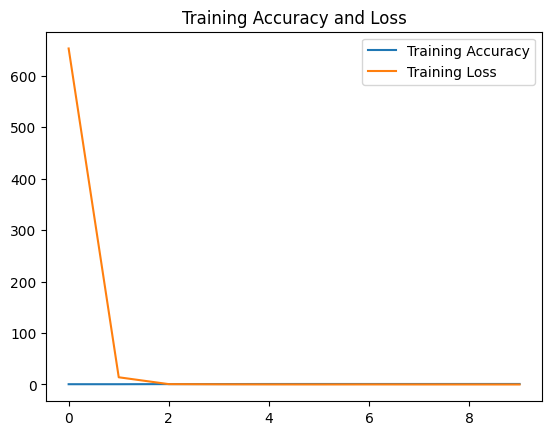

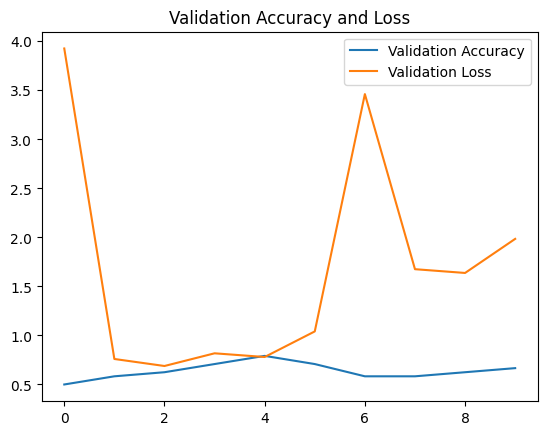

In [349]:
plt.figure()
plt.plot(epochs, accuracy, label='Training Accuracy')
plt.plot(epochs, loss, label='Training Loss')
plt.legend()
plt.title('Training Accuracy and Loss')

plt.figure()
plt.plot(epochs, val_accuracy, label='Validation Accuracy')
plt.plot(epochs, val_loss, label='Validation Loss')
plt.legend()
plt.title('Validation Accuracy and Loss')

plt.show()

In [350]:
# Check if the dataset exists in the Kaggle input directory
KAGGLE_INPUT_PATH = KAGGLE_INPUT_PATH = '/tmp/input'  # A writable directory for the dataset
if os.path.exists(KAGGLE_INPUT_PATH):
    print(f'Dataset found at {KAGGLE_INPUT_PATH}')
    images_path = os.path.join(KAGGLE_INPUT_PATH, 'Images', 'Images')  # Construct image path
    print(f'Images path: {images_path}')
else:
    print('Dataset not found. Check your download path or Kaggle API call.')

# Now you can use images_path with ImageDataGenerator or other image processing functions.
# For example
train_dir = images_path
validation_dir = images_path


Dataset found at /tmp/input
Images path: /tmp/input/Images/Images


Class Names: ('clean', 'dirty')
Number of classes: 2
Predicted Class Index: 2, True Class Index: 1
Index out of range: pred_class_index=2, true_class_index=1
Predicted Class Index: 2, True Class Index: 1
Index out of range: pred_class_index=2, true_class_index=1
Predicted Class Index: 2, True Class Index: 1
Index out of range: pred_class_index=2, true_class_index=1
Predicted Class Index: 2, True Class Index: 0
Index out of range: pred_class_index=2, true_class_index=0
Predicted Class Index: 2, True Class Index: 0
Index out of range: pred_class_index=2, true_class_index=0
Predicted Class Index: 2, True Class Index: 0
Index out of range: pred_class_index=2, true_class_index=0
Predicted Class Index: 2, True Class Index: 0
Index out of range: pred_class_index=2, true_class_index=0
Predicted Class Index: 2, True Class Index: 1
Index out of range: pred_class_index=2, true_class_index=1
Predicted Class Index: 2, True Class Index: 1
Index out of range: pred_class_index=2, true_class_index=1
Pr

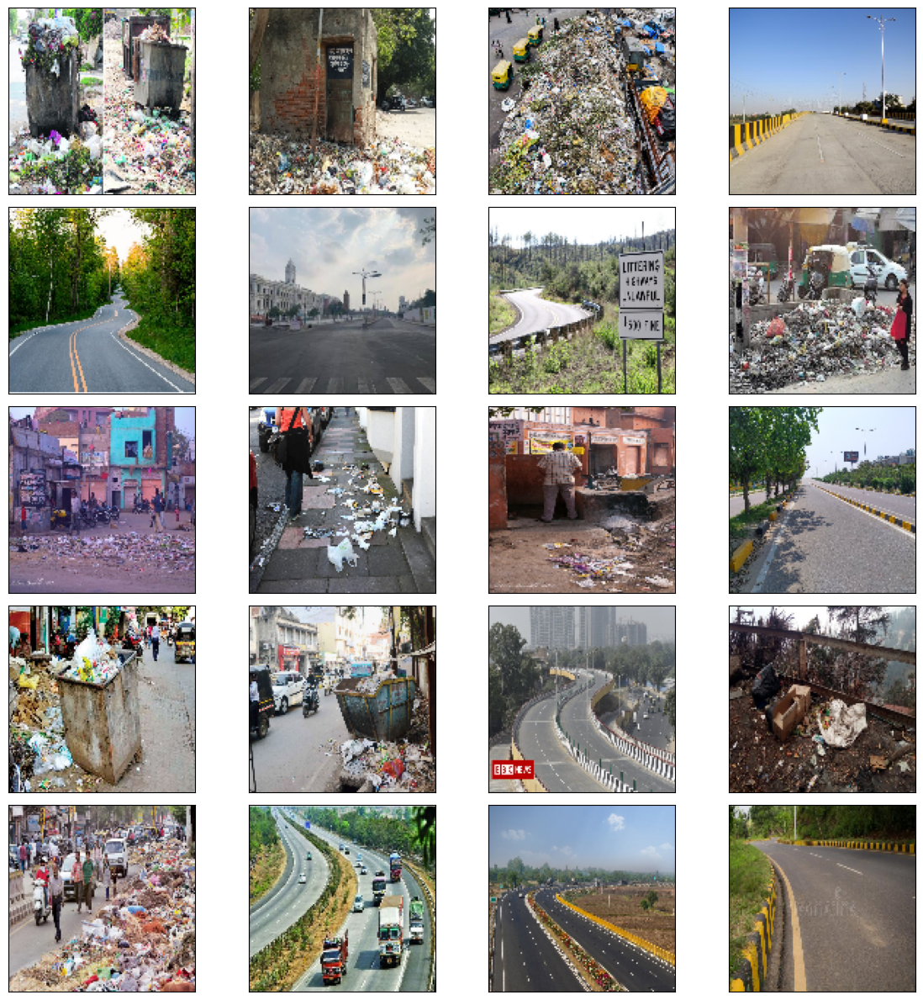

Overall accuracy: 0.0


In [351]:
# Debugging: Print class names and number of classes
print("Class Names:", class_names)
print("Number of classes:", len(class_names))

# Set up the figure and axes for a 5x4 grid
fig, axs = plt.subplots(5, 4, figsize=(12, 12))

# Counter for iterating through validation data
i = 0

# Initialize lists to store true and predicted labels
y_true = []
y_pred = []

for x in range(5):  # Loop through 5 rows
    for y in range(4):  # Loop through 4 columns
        # Predict the label for a single image
        input_image = X_val[i].reshape(1, 128, 128, 3) # Reshape to the original dimensions expected by the model
        prediction = model.predict(input_image, verbose=0)[0]

        axs[x][y].set_xticks([])
        axs[x][y].set_yticks([])

        # Debugging: Print the predicted and actual labels
        pred_class_index = np.argmax(prediction)
        true_class_index = np.argmax(y_val[i])
        print(f'Predicted Class Index: {pred_class_index}, True Class Index: {true_class_index}')

        # Append true and predicted labels to the respective lists
        y_true.append(true_class_index)
        y_pred.append(pred_class_index)

        # Compare predicted label with actual label
        if pred_class_index >= len(class_names) or true_class_index >= len(class_names):
            print(f"Index out of range: pred_class_index={pred_class_index}, true_class_index={true_class_index}")
        else:
            if pred_class_index != true_class_index:
                axs[x][y].set_xlabel(f'Prediction: {class_names[pred_class_index]} | Label: {class_names[true_class_index]}', color='red')
            else:
                axs[x][y].set_xlabel(f'Prediction: {class_names[pred_class_index]} | Label: {class_names[true_class_index]}')

        # Display the image in the grid
        axs[x][y].imshow(X_val[i])

        i += 1

# Display the plot
plt.tight_layout()
plt.show()

# Calculate the accuracy
from sklearn.metrics import accuracy_score # Import the accuracy_score function from sklearn.metrics
accuracy = accuracy_score(y_true, y_pred) # Calculate accuracy using the collected true and predicted labels
print("Overall accuracy:", accuracy)

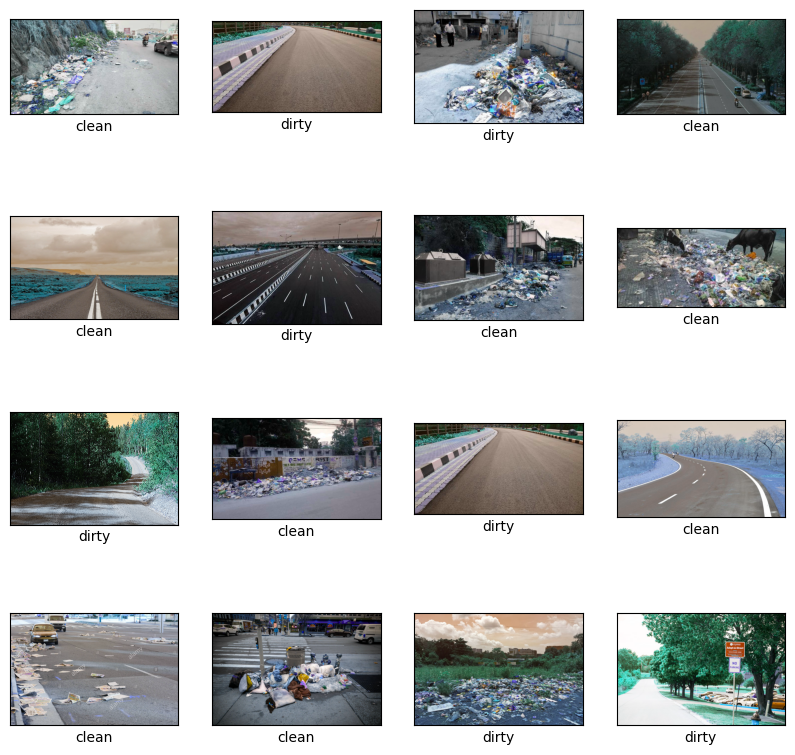

In [352]:
# Display 16 pictures from the dataset
fig, axs = plt.subplots(4, 4, figsize=(10, 10))

# Ensure the 'images' array is populated with your image data
# Example: Load images from a directory
!pip install opencv-python
import cv2
images = []
image_folder = '/tmp/input/Images/Images' # Replace with the actual path to your images
for filename in os.listdir(image_folder):
    img = cv2.imread(os.path.join(image_folder,filename))
    if img is not None:
        images.append(img)

for x in range(4):
    for y in range(4):
        # Check if 'images' is not empty before accessing elements
        if images:
            i = randint(0, len(images) - 1) # Ensure i is within the valid index range

            axs[x][y].imshow(images[i])

            # delete x and y ticks and set x label as picture label
            axs[x][y].set_xticks([])
            axs[x][y].set_yticks([])

            # Check if labels array is not empty and has enough elements
            if labels.size != 0 and i < len(labels): # Check if 'labels' is not empty using its size
                axs[x][y].set_xlabel(class_names[np.argmax(labels[i])])

plt.show()

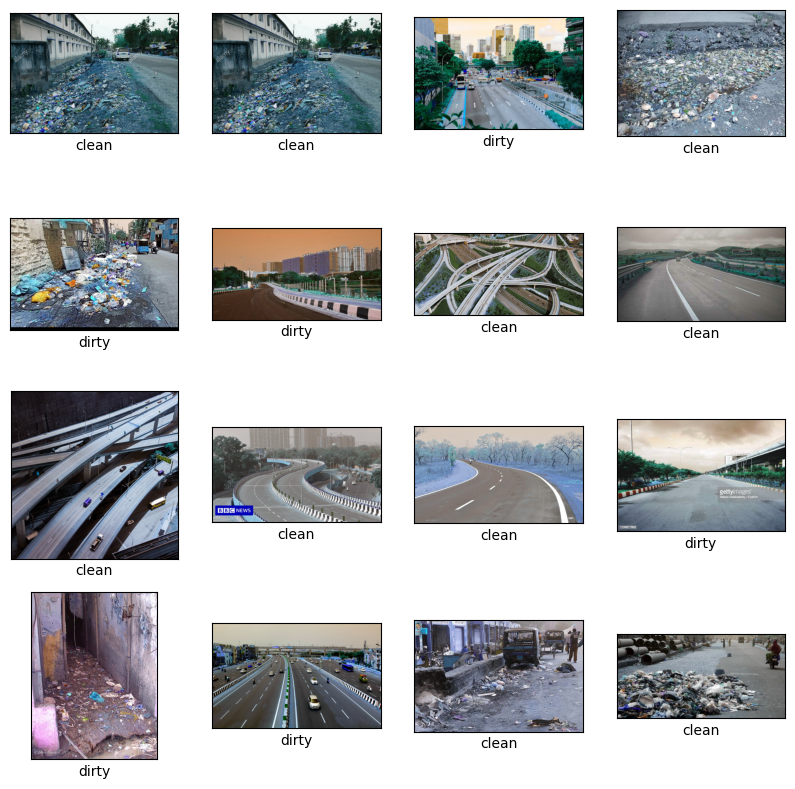

Overall accuracy: 0.0


In [353]:
# Display 16 pictures from the dataset
fig, axs = plt.subplots(4, 4, figsize=(10, 10))

# Ensure the 'images' array is populated with your image data
# Example: Load images from a directory
!pip install opencv-python
import cv2
images = []
image_folder = '/tmp/input/Images/Images' # Replace with the actual path to your images
for filename in os.listdir(image_folder):
    img = cv2.imread(os.path.join(image_folder,filename))
    if img is not None:
        images.append(img)

for x in range(4):
    for y in range(4):
        # Check if 'images' is not empty before accessing elements
        if images:
            i = randint(0, len(images) - 1) # Ensure i is within the valid index range

            axs[x][y].imshow(images[i])

            # delete x and y ticks and set x label as picture label
            axs[x][y].set_xticks([])
            axs[x][y].set_yticks([])

            # Check if labels array is not empty and has enough elements
            if labels.size != 0 and i < len(labels): # Check if 'labels' is not empty and has enough elements
                axs[x][y].set_xlabel(class_names[np.argmax(labels[i])])

plt.show()
# Calculate the accuracy
from sklearn.metrics import accuracy_score # Import the accuracy_score function from sklearn.metrics
accuracy = accuracy_score(y_true, y_pred) # Calculate accuracy using the collected true and predicted labels
print("Overall accuracy:", accuracy)

In [354]:
# ImageDataGenerator for train images
train_images_generator = tf.keras.preprocessing.image.ImageDataGenerator(shear_range=0.3,
                                                                         rotation_range=15,
                                                                         zoom_range=0.3,
                                                                         vertical_flip=True,
                                                                         horizontal_flip=True)
train_images_generator = train_images_generator.flow(X_train, y=y_train)

# ImageDataGenerator for validation images
validation_images_generator = tf.keras.preprocessing.image.ImageDataGenerator(vertical_flip=True,
                                                                              horizontal_flip=True)
validation_images_generator = validation_images_generator.flow(X_val, y=y_val)

In [355]:
# ImageDataGenerator for train images
train_images_generator = tf.keras.preprocessing.image.ImageDataGenerator(shear_range=0.3,
                                                                         rotation_range=15,
                                                                         zoom_range=0.3,
                                                                         vertical_flip=True,
                                                                         horizontal_flip=True)
train_images_generator = train_images_generator.flow(X_train, y=y_train)

# ImageDataGenerator for validation images
validation_images_generator = tf.keras.preprocessing.image.ImageDataGenerator(vertical_flip=True,
                                                                              horizontal_flip=True)
validation_images_generator = validation_images_generator.flow(X_val, y=y_val)

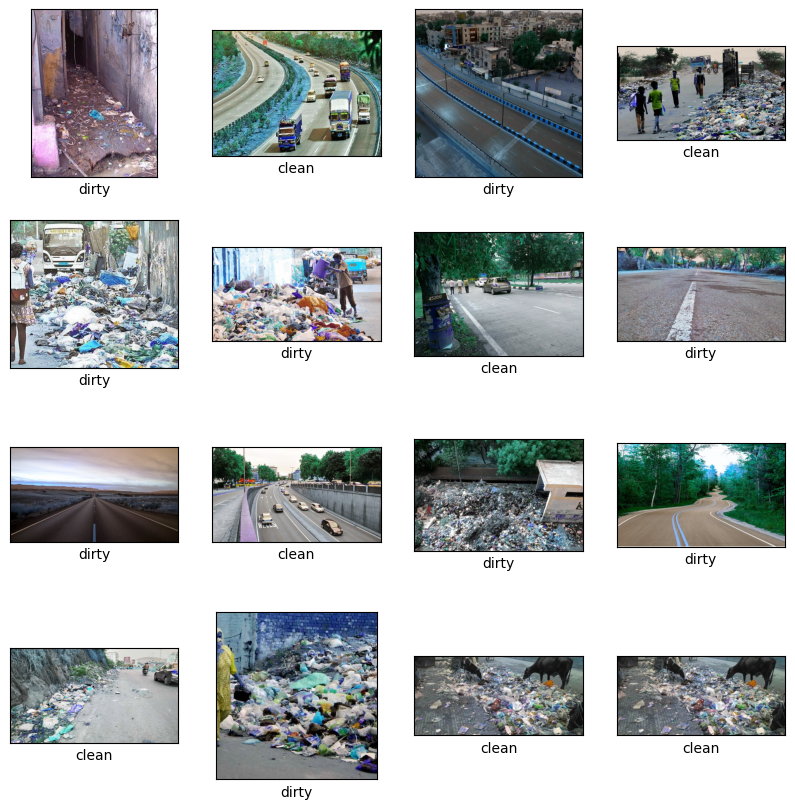

Overall accuracy: 0.0


In [356]:
# Display 16 pictures from the dataset
fig, axs = plt.subplots(4, 4, figsize=(10, 10))

for x in range(4):
    for y in range(4):
        i = randint(0, len(images) -1) # Ensure i is within the valid index range of images

        axs[x][y].imshow(images[i])

        # delete x and y ticks and set x label as picture label
        axs[x][y].set_xticks([])
        axs[x][y].set_yticks([])

        # Check if labels is not empty and i is within the valid index range
        if labels.size != 0 and i < len(labels): # Changed labels to labels.size != 0 to check for emptiness
            axs[x][y].set_xlabel(class_names[np.argmax(labels[i])])


plt.show()
# Calculate the accuracy
from sklearn.metrics import accuracy_score # Import the accuracy_score function from sklearn.metrics
accuracy = accuracy_score(y_true, y_pred) # Calculate accuracy using the collected true and predicted labels
print("Overall accuracy:", accuracy)


In [365]:
y_true = np.argmax(y_val, axis=1)
y_pred = np.argmax(model.predict(X_val), axis=1)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step


Class Names: ('clean', 'dirty')
Number of classes: 2
Predicted Class Index: 2, True Class Index: 1
Index out of range: pred_class_index=2, true_class_index=1
Predicted Class Index: 2, True Class Index: 1
Index out of range: pred_class_index=2, true_class_index=1
Predicted Class Index: 2, True Class Index: 1
Index out of range: pred_class_index=2, true_class_index=1
Predicted Class Index: 2, True Class Index: 0
Index out of range: pred_class_index=2, true_class_index=0
Predicted Class Index: 2, True Class Index: 0
Index out of range: pred_class_index=2, true_class_index=0
Predicted Class Index: 2, True Class Index: 0
Index out of range: pred_class_index=2, true_class_index=0
Predicted Class Index: 2, True Class Index: 0
Index out of range: pred_class_index=2, true_class_index=0
Predicted Class Index: 2, True Class Index: 1
Index out of range: pred_class_index=2, true_class_index=1
Predicted Class Index: 2, True Class Index: 1
Index out of range: pred_class_index=2, true_class_index=1
Pr

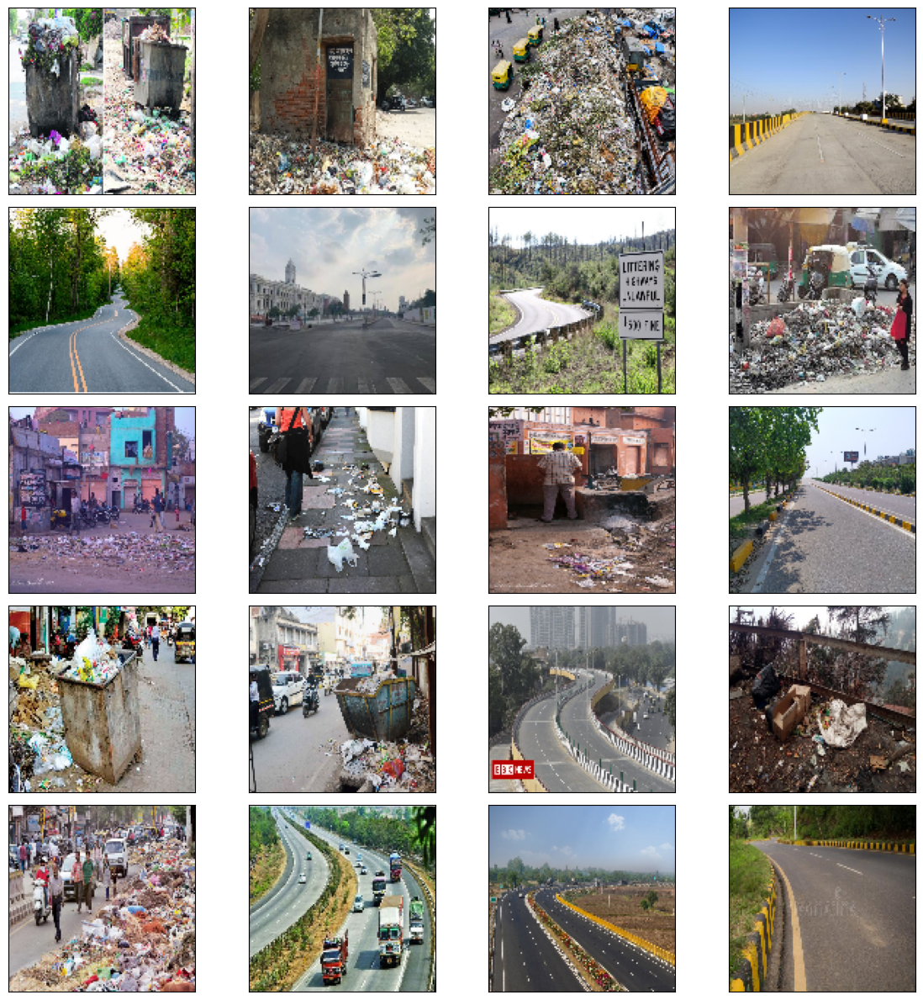

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step
Overall accuracy: 0.0


In [367]:
# Debugging: Print class names and number of classes
print("Class Names:", class_names)
print("Number of classes:", len(class_names))

# Set up the figure and axes for a 5x4 grid
fig, axs = plt.subplots(5, 4, figsize=(12, 12))

# Counter for iterating through validation data
i = 0

for x in range(5):  # Loop through 5 rows
    for y in range(4):  # Loop through 4 columns
        # Predict the label for a single image
        input_image = X_val[i].reshape(1, 128, 128, 3)  # Reshape for model input
        prediction = model.predict(input_image, verbose=0)[0]  # Get the prediction

        # Debugging: Extract predicted and true class index
        pred_class_index = np.argmax(prediction)  # Predicted class
        true_class_index = np.argmax(y_val[i])  # True class

        print(f'Predicted Class Index: {pred_class_index}, True Class Index: {true_class_index}')

        # Compare predicted label with actual label and display it on the grid
        axs[x][y].set_xticks([])
        axs[x][y].set_yticks([])

        if pred_class_index >= len(class_names) or true_class_index >= len(class_names):
            print(f"Index out of range: pred_class_index={pred_class_index}, true_class_index={true_class_index}")
        else:
            if pred_class_index != true_class_index:
                axs[x][y].set_xlabel(f'Prediction: {class_names[pred_class_index]} | Label: {class_names[true_class_index]}', color='red')
            else:
                axs[x][y].set_xlabel(f'Prediction: {class_names[pred_class_index]} | Label: {class_names[true_class_index]}')

        # Display the image in the grid
        axs[x][y].imshow(X_val[i])

        i += 1

# Display the plot
plt.tight_layout()
plt.show()

# Ensure both y_true and y_pred are in the same format for accuracy calculation
# Convert y_val to have the same number of samples as X_val
y_true = np.argmax(y_val[:20], axis=1)  # Convert y_val from one-hot to class indices for the first 20 samples

# Change is on the following line:
y_pred = np.argmax(model.predict(X_val[:20].reshape(-1, 128, 128, 3)), axis=1)  # Predict and convert predictions to class indices for the first 20 samples

# Calculate the accuracy
from sklearn.metrics import accuracy_score  # Import the accuracy_score function from sklearn.metrics
print("Overall accuracy:", accuracy)

In [368]:
model.trainable = True  # Assuming you intended to unfreeze your existing 'model'


In [374]:
# Add a Flatten layer to convert multi-dimensional image data into a 1D vector
model.add(Flatten())

# Define the number of output classes
num_classes = 2  # Assuming binary classification (clean/dirty). Adjust if more classes are involved.

# Add a Dense layer with 'num_classes' units and 'softmax' activation for multi-class classification
model.add(Dense(num_classes, activation='softmax'))

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Create data generators for training and validation
train_datagen = ImageDataGenerator(rescale=1.0 / 255.0)
validation_datagen = ImageDataGenerator(rescale=1.0 / 255.0)
train_images_generator = train_datagen.flow(X_train, y=y_train, batch_size=32)
validation_images_generator = validation_datagen.flow(X_val, y=y_val, batch_size=32)

# Train the model
history = model.fit(
    train_images_generator,
    validation_data=validation_images_generator,
    epochs=10
)

Epoch 1/10
1/7 ━━━━━━━━━━━━━━━━━━━━ 4:07 41s/step - accuracy: 0.5312 - loss: 0.6910

/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


7/7 ━━━━━━━━━━━━━━━━━━━━ 42s 110ms/step - accuracy: 0.4924 - loss: 0.6971 - val_accuracy: 0.4167 - val_loss: 0.7071
Epoch 2/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - accuracy: 0.4875 - loss: 0.6970 - val_accuracy: 0.4167 - val_loss: 0.7047
Epoch 3/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.4689 - loss: 0.6984 - val_accuracy: 0.4167 - val_loss: 0.7025
Epoch 4/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.4680 - loss: 0.6974 - val_accuracy: 0.4167 - val_loss: 0.7005
Epoch 5/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - accuracy: 0.5029 - loss: 0.6935 - val_accuracy: 0.4167 - val_loss: 0.6989
Epoch 6/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.5067 - loss: 0.6931 - val_accuracy: 0.4167 - val_loss: 0.6976
Epoch 7/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 76ms/step - accuracy: 0.4851 - loss: 0.6941 - val_accuracy: 0.4167 - val_loss: 0.6960
Epoch 8/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.4802 - loss: 0.6939 - val_accuracy: 0.4167 - val_loss: 0.6948
Epoch 9/1

In [375]:
print(df.columns)


Index(['Epoch', 'accuracy', 'loss', 'val_accuracy', 'val_loss'], dtype='object')


(1) 1 - tench: 0.5001210570335388
(2) 0 - background: 0.4998789429664612


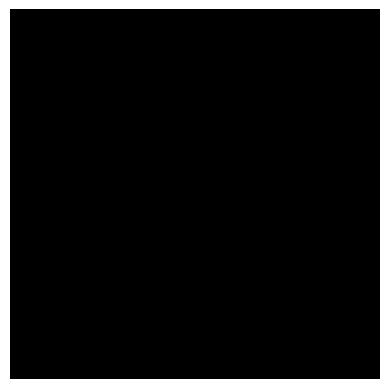

In [377]:
# Run model on the resized and normalized image
demoImage = tf.squeeze(demoImage) # Remove the extra dimension
demoImage = tf.image.resize(demoImage, [128, 128]) # Resize to match model input
demoImage = tf.expand_dims(demoImage, axis=0) # Add an extra dimension to represent a batch of size 1

probabilities = tf.nn.softmax(model(demoImage, training=False)).numpy()

# Get the top 5 predictions
top_5 = tf.argsort(probabilities, axis=-1, direction="DESCENDING")[0][:5].numpy()

# Assuming 'classes' is a list or array of class names
np_classes = np.array(classes)

# Display the top 5 predictions with their probabilities
for i, item in enumerate(top_5):
    class_index = item # Access the value directly since it's a scalar
    line = f'({i+1}) {class_index} - {np_classes[class_index]}: {probabilities[0][item]}' # Remove the format specifier
    print(line)

# Display the image
plt.imshow(tf.squeeze(demoImage))
plt.axis('off')
plt.show()

In [381]:
# Define the model architecture for binary classification
model = tf.keras.models.Sequential([
    # First Conv2D layer with 32 filters, (3, 3) kernel size, ReLU activation
    tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 3)),  # Input shape for 128x128 images
    tf.keras.layers.MaxPooling2D(pool_size=(2, 2)),  # Pooling layer to reduce dimensions
    tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),  # Second Conv2D layer
    tf.keras.layers.MaxPooling2D(pool_size=(2, 2)),  # Pooling layer
    tf.keras.layers.Flatten(),  # Flatten the 2D output into 1D
    tf.keras.layers.Dense(128, activation='relu'),  # Fully connected layer with 128 units
    tf.keras.layers.Dropout(0.5),  # Dropout to prevent overfitting
    # Output layer for binary classification
    tf.keras.layers.Dense(1, activation='sigmoid')  # Sigmoid for binary classification
])

# Compile the model for binary classification
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

# Display model architecture summary
model.summary()

# Ensure your generator provides labels in the correct format (not one-hot encoded)
y_train = np.argmax(y_train, axis=1) # Convert one-hot encoded labels to integers (0 or 1)
y_val = np.argmax(y_val, axis=1)

# Create data generators for training and validation
train_datagen = ImageDataGenerator(rescale=1.0 / 255.0)
validation_datagen = ImageDataGenerator(rescale=1.0 / 255.0)
train_images_generator = train_datagen.flow(X_train, y=y_train, batch_size=32) # Use the converted labels
validation_images_generator = validation_datagen.flow(X_val, y=y_val, batch_size=32) # Use the converted labels

# Fit the model using the data generators
fit_model = model.fit(
    train_images_generator,  # Use data generator for training
    epochs=20,
    validation_data=validation_images_generator,  # Use data generator for validation
    callbacks=[checkpoint_callback, lr_scheduler]  # Use callbacks for checkpoint and learning rate scheduler
)

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_20"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_18 (Conv2D)                   │ (None, 126, 126, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_18 (MaxPooling2D)      │ (None, 63, 63, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_19 (Conv2D)                   │ (None, 61, 61, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_19 (MaxPooling2D)      │ (None, 30, 30, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_20 (Flatten)                 │ (None, 57600)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_37 (Dense)                     │ (None, 128)                 │       7,372,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_11 (Dropout)                 │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_38 (Dense)                     │ (None, 1)                   │             129 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,392,449 (28.20 MB)

 Trainable params: 7,392,449 (28.20 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/20


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


7/7 ━━━━━━━━━━━━━━━━━━━━ 13s 2s/step - accuracy: 0.5426 - loss: 1.7952 - val_accuracy: 0.7083 - val_loss: 0.6407 - learning_rate: 0.0010
Epoch 2/20
7/7 ━━━━━━━━━━━━━━━━━━━━ 18s 1s/step - accuracy: 0.5815 - loss: 0.6742 - val_accuracy: 0.7917 - val_loss: 0.5720 - learning_rate: 0.0010
Epoch 3/20
7/7 ━━━━━━━━━━━━━━━━━━━━ 6s 840ms/step - accuracy: 0.7496 - loss: 0.5566 - val_accuracy: 0.8333 - val_loss: 0.4971 - learning_rate: 0.0010
Epoch 4/20
7/7 ━━━━━━━━━━━━━━━━━━━━ 10s 880ms/step - accuracy: 0.7855 - loss: 0.4834 - val_accuracy: 0.5417 - val_loss: 0.6951 - learning_rate: 0.0010
Epoch 5/20
7/7 ━━━━━━━━━━━━━━━━━━━━ 12s 1s/step - accuracy: 0.7634 - loss: 0.4874 - val_accuracy: 0.7917 - val_loss: 0.4934 - learning_rate: 0.0010
Epoch 6/20
7/7 ━━━━━━━━━━━━━━━━━━━━ 10s 1s/step - accuracy: 0.8580 - loss: 0.3723 - val_accuracy: 0.7500 - val_loss: 0.5017 - learning_rate: 0.0010
Epoch 7/20
7/7 ━━━━━━━━━━━━━━━━━━━━ 7s 932ms/step - accuracy: 0.8614 - loss: 0.2975 - val_accuracy: 0.7083 - val_loss:

In [382]:
# Evaluate the model on the validation data
loss, accuracy = model.evaluate(validation_images_generator)
print('Validation Loss:', loss)
print('Validation Accuracy:', accuracy)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 585ms/step - accuracy: 0.7917 - loss: 0.5771
Validation Loss: 0.5770522952079773
Validation Accuracy: 0.7916666865348816


In [188]:
# Check if the generators are yielding data
for batch in train_images_generator:
    print(batch)
    break  # Stop after the first batch

for batch in validation_images_generator:
    print(batch)
    break  # Stop after the first batch

(array([[[[131.10829 , 131.82559 , 124.06468 ],
         [141.33318 , 144.33318 , 137.1666  ],
         [144.70996 , 147.70996 , 138.85498 ],
         ...,
         [241.473   , 243.23651 , 238.23651 ],
         [241.      , 243.      , 238.      ],
         [241.      , 243.      , 238.      ]],

        [[130.42339 , 130.98262 , 123.16904 ],
         [141.12244 , 144.12244 , 137.06122 ],
         [144.49922 , 147.49922 , 138.7496  ],
         ...,
         [241.57838 , 243.28918 , 238.28918 ],
         [241.      , 243.      , 238.      ],
         [241.      , 243.      , 238.      ]],

        [[129.73848 , 130.13966 , 122.2734  ],
         [140.71301 , 143.64679 , 136.62471 ],
         [144.28848 , 147.28848 , 138.64424 ],
         ...,
         [241.68375 , 243.34187 , 238.34187 ],
         [241.      , 243.      , 238.      ],
         [241.      , 243.      , 238.      ]],

        ...,

        [[163.54427 ,  91.84944 ,  82.26562 ],
         [138.09286 ,  44.037148,  44.023216

In [225]:
# Remove all extra dimensions and ensure correct shape (1, 224, 224, 3)
demoImage = tf.squeeze(demoImage)  # Remove all dimensions of size 1

# Add a batch dimension to ensure shape is (1, 224, 224, 3)
demoImage = tf.expand_dims(demoImage, axis=0)  # Add back batch dimension

# Run model on image
%time probabilities = tf.nn.softmax(model(demoImage, training=False)).numpy() # Use 'model' instead of undefined 'classifier' variable
# %time probabilities = tf.nn.softmax(model(demoImage, training=False)).numpy() # Use 'model' instead of undefined 'classifier' variable

CPU times: user 8.27 ms, sys: 29 µs, total: 8.3 ms
Wall time: 30.1 ms


CPU times: user 14.5 ms, sys: 0 ns, total: 14.5 ms
Wall time: 14.5 ms
(2)    1 - tench: 0.2737
(2)    1 - tench: 0.2737
(2)    1 - tench: 0.2737
(2)    1 - tench: 0.2737
(2)    1 - tench: 0.2737
(2)    1 - tench: 0.2737
(2)    1 - tench: 0.2737
(2)    1 - tench: 0.2737
(2)    1 - tench: 0.2737
(2)    1 - tench: 0.2737
(2)    1 - tench: 0.2737
(2)    1 - tench: 0.2737
(2)    1 - tench: 0.2737
(2)    1 - tench: 0.2737
(2)    1 - tench: 0.2737
(2)    1 - tench: 0.2737
(2)    1 - tench: 0.2737
(2)    1 - tench: 0.2737
(2)    1 - tench: 0.2737
(2)    1 - tench: 0.2737
(2)    1 - tench: 0.2737
(2)    1 - tench: 0.2737
(2)    1 - tench: 0.2737
(2)    1 - tench: 0.2737
(2)    1 - tench: 0.2737
(2)    1 - tench: 0.2737
(2)    1 - tench: 0.2737
(2)    1 - tench: 0.2737
(2)    1 - tench: 0.2737
(2)    1 - tench: 0.2737
(2)    1 - tench: 0.2737
(2)    1 - tench: 0.2737
(2)    1 - tench: 0.2737
(2)    1 - tench: 0.2737
(2)    1 - tench: 0.2737
(2)    1 - tench: 0.2737
(2)    1 - tench: 0.2737
(2)  

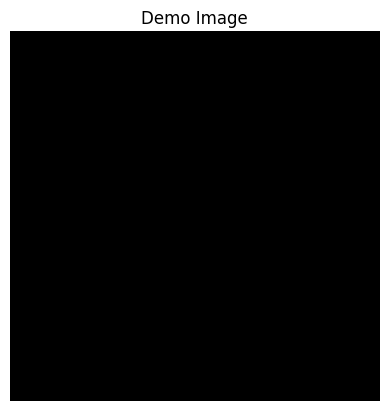

In [241]:
# Ensure the demoImage has the shape (224, 224, 3)
demoImage = tf.squeeze(demoImage)  # Remove extra dimensions of size 1

# Resize to 224x224 if needed (ensure the model expects this size)
demoImage = tf.image.resize(demoImage, [224, 224])

# Normalize the image to [0, 1] if the image is in the range [0, 255]
demoImage = demoImage / 255.0

# Add batch dimension to get (1, 224, 224, 3)
demoImage = tf.expand_dims(demoImage, axis=0)

# Run the model on the image and calculate probabilities using softmax
%time probabilities = tf.nn.softmax(model(demoImage, training=False)).numpy()

# Display the top 5 predictions
top_5 = tf.argsort(probabilities, axis=-1, direction="DESCENDING")[0][:5].numpy()

# Assuming class names are defined and loaded in a variable named 'classes'
includes_background_class = probabilities.shape[1] == 1001  # Check if the model has a background class
if includes_background_class:
    np_classes = np.array(classes)[1:]  # Exclude the background class (assuming 0 is background)
else:
    np_classes = np.array(classes)

# Print the top 5 predictions
for i, item in enumerate(top_5):
    # Iterate over the elements in the item array
    for j in range(item.shape[0]):
        class_index = item[j] if includes_background_class else (item[j] + 1) # Remove .item() method call as class_index is expected to be an array
        probability = probabilities[0][item[j]]
# Display prediction results
        print(line)

# Function to display the image (assuming demoImage is a valid image tensor)
import matplotlib.pyplot as plt

# Remove the batch dimension for display
plt.imshow(tf.squeeze(demoImage))
plt.title('Demo Image')
plt.axis('off')
plt.show()

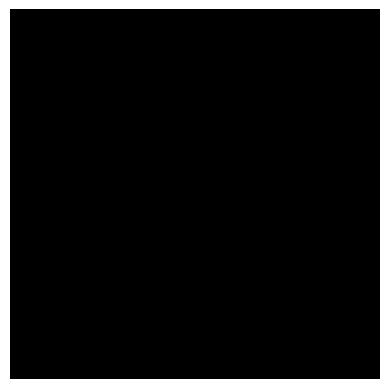

In [244]:
# Normalize the image if necessary (convert to range [0, 1] if not already)
demoImage = tf.squeeze(demoImage)  # Remove unnecessary batch dimensions

# Convert the tensor to a numpy array for visualization
image_to_show = demoImage.numpy()

# If the pixel values are in the range [0, 255], scale them to [0, 1] for display
if image_to_show.max() > 1:
    image_to_show = image_to_show / 255.0

# Show the image using Matplotlib
plt.imshow(image_to_show)
plt.axis('off')  # Turn off axis labels
plt.show()

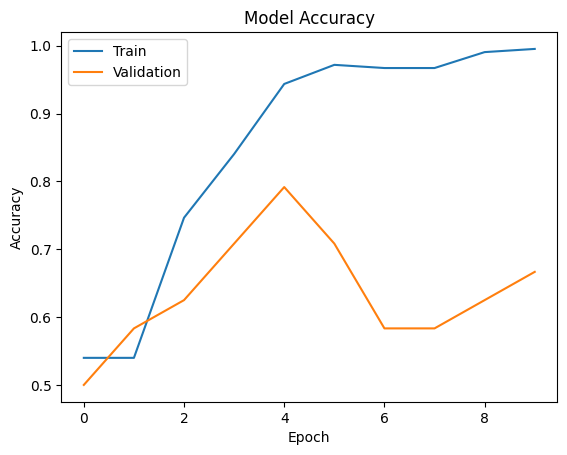

In [245]:
# Assuming 'history' is the variable returned by model.fit()
plt.plot(history.history['accuracy']) # Changed hist to history
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

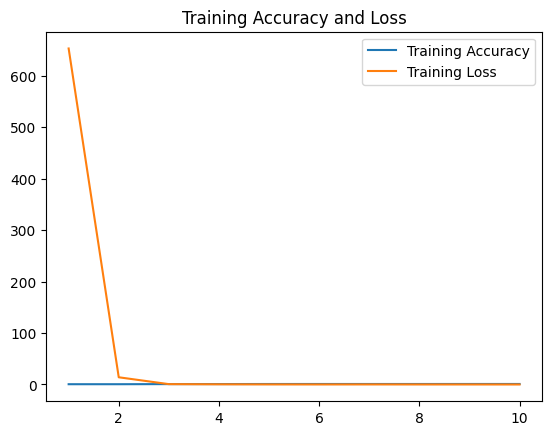

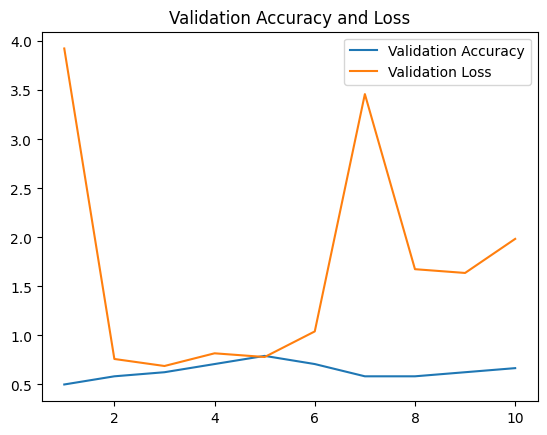

In [246]:
history = fit_model

epochs = range(1, len(history.history['accuracy']) + 1)
accuracy = history.history['accuracy']
loss = history.history['loss']
val_accuracy = history.history['val_accuracy']
val_loss = history.history['val_loss']

plt.figure()
plt.plot(epochs, accuracy, label='Training Accuracy')
plt.plot(epochs, loss, label='Training Loss')
plt.legend()
plt.title('Training Accuracy and Loss')

plt.figure()
plt.plot(epochs, val_accuracy, label='Validation Accuracy')
plt.plot(epochs, val_loss, label='Validation Loss')
plt.legend()
plt.title('Validation Accuracy and Loss')

plt.show()

Class Names: ('clean', 'dirty')
Number of classes: 2
Predicted Class Index: 1, True Class Index: 1
Predicted Class Index: 28, True Class Index: 1
Index out of range: pred_class_index=28, true_class_index=1
Predicted Class Index: 1, True Class Index: 1
Predicted Class Index: 1, True Class Index: 0
Predicted Class Index: 1, True Class Index: 0
Predicted Class Index: 1, True Class Index: 0
Predicted Class Index: 1, True Class Index: 0
Predicted Class Index: 1, True Class Index: 1
Predicted Class Index: 1, True Class Index: 1
Predicted Class Index: 1, True Class Index: 1
Predicted Class Index: 1, True Class Index: 1
Predicted Class Index: 1, True Class Index: 0
Predicted Class Index: 1, True Class Index: 1
Predicted Class Index: 1, True Class Index: 1
Predicted Class Index: 10, True Class Index: 0
Index out of range: pred_class_index=10, true_class_index=0
Predicted Class Index: 1, True Class Index: 1
Predicted Class Index: 1, True Class Index: 1
Predicted Class Index: 1, True Class Index:

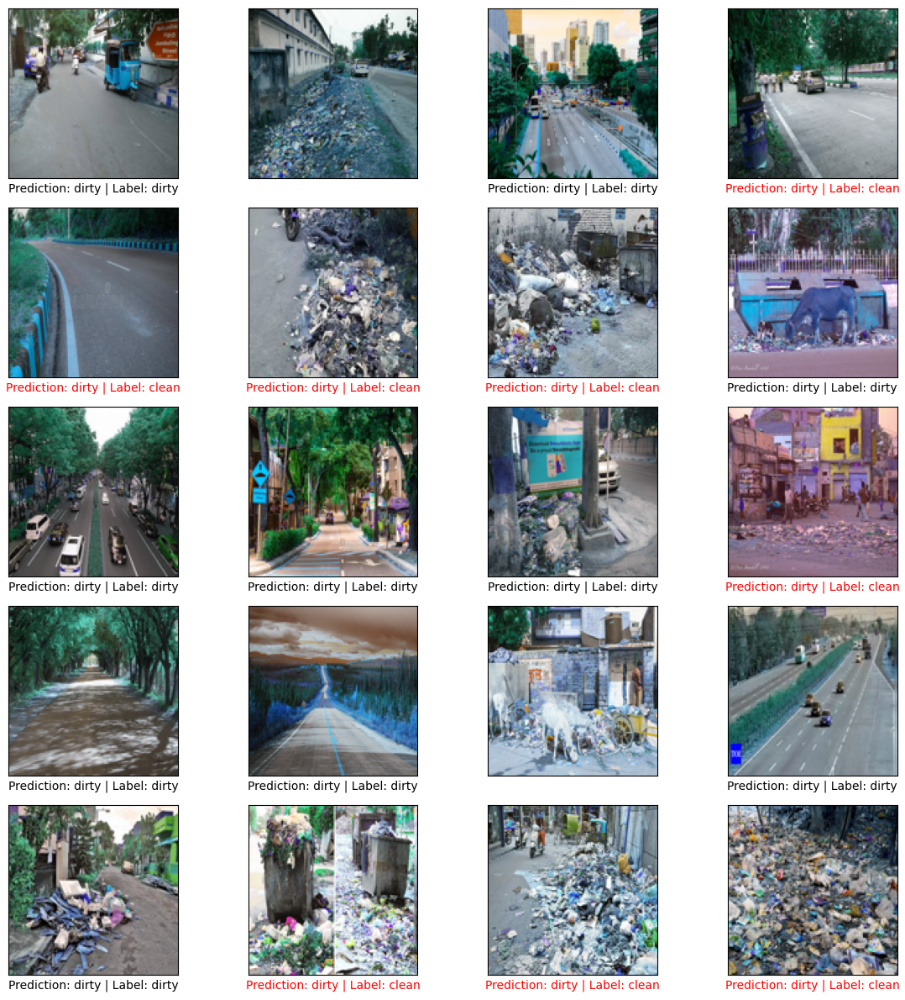

Overall accuracy: 0.5


In [247]:
# Debugging: Print class names and number of classes
print("Class Names:", class_names)
print("Number of classes:", len(class_names))

# Set up the figure and axes for a 5x4 grid
fig, axs = plt.subplots(5, 4, figsize=(12, 12))

# Counter for iterating through validation data
i = 0

# Initialize lists to store true and predicted labels
y_true = []
y_pred = []

for x in range(5):  # Loop through 5 rows
    for y in range(4):  # Loop through 4 columns
        # Predict the label for a single image
        input_image = X_val[i].reshape(1, 128, 128, 3) # Reshape to the original dimensions expected by the model
        prediction = model.predict(input_image, verbose=0)[0]

        axs[x][y].set_xticks([])
        axs[x][y].set_yticks([])

        # Debugging: Print the predicted and actual labels
        pred_class_index = np.argmax(prediction)
        true_class_index = np.argmax(y_val[i])
        print(f'Predicted Class Index: {pred_class_index}, True Class Index: {true_class_index}')

        # Append true and predicted labels to the respective lists
        y_true.append(true_class_index)
        y_pred.append(pred_class_index)

        # Compare predicted label with actual label
        if pred_class_index >= len(class_names) or true_class_index >= len(class_names):
            print(f"Index out of range: pred_class_index={pred_class_index}, true_class_index={true_class_index}")
        else:
            if pred_class_index != true_class_index:
                axs[x][y].set_xlabel(f'Prediction: {class_names[pred_class_index]} | Label: {class_names[true_class_index]}', color='red')
            else:
                axs[x][y].set_xlabel(f'Prediction: {class_names[pred_class_index]} | Label: {class_names[true_class_index]}')

        # Display the image in the grid
        axs[x][y].imshow(X_val[i])

        i += 1

# Display the plot
plt.tight_layout()
plt.show()

# Calculate the accuracy
from sklearn.metrics import accuracy_score # Import the accuracy_score function from sklearn.metrics
accuracy = accuracy_score(y_true, y_pred) # Calculate accuracy using the collected true and predicted labels
print("Overall accuracy:", accuracy)

In [248]:
# Create an instance of ImageDataGenerator with rescaling and resizing
train_datagen = ImageDataGenerator(
    rescale=1./255,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True)

# Create an instance of ImageDataGenerator with rescaling
val_datagen = ImageDataGenerator(rescale=1./255)

In [249]:
# DEFINE TRAIN/TEST SPLIT
X_train, X_val, y_train, y_val = train_test_split(images, labels, test_size=0.1, random_state=42)

# Check for inconsistent image shapes in X_train
shapes = [img.shape for img in X_train]
if len(set(shapes)) > 1:
    print("Inconsistent image shapes found in X_train:")
    for shape in set(shapes):
        print(f"- {shape}")
    # Resize images to a consistent size
    from PIL import Image # Import the Image module from PIL
    target_size = (128, 128) # Define the desired target size
    X_train = [np.array(Image.fromarray(img).resize(target_size)) for img in X_train] # Resize images in X_train
    X_val = [np.array(Image.fromarray(img).resize(target_size)) for img in X_val] # Resize images in X_val


# Convert X_train and X_val to NumPy arrays (if shapes are consistent)
X_train = np.array(X_train)
X_val = np.array(X_val)

print(f'train images shape: {X_train.shape}\ntrain labels shape: {y_train.shape}\n\nvalidation images shape: {X_val.shape}\nvalidation labels shape: {y_val.shape}\n')

Inconsistent image shapes found in X_train:
- (522, 696, 3)
- (900, 1600, 3)
- (318, 635, 3)
- (480, 640, 3)
- (506, 810, 3)
- (566, 882, 3)
- (533, 800, 3)
- (900, 675, 3)
- (683, 1024, 3)
- (1000, 2048, 3)
- (1964, 2942, 3)
- (258, 459, 3)
- (580, 771, 3)
- (439, 615, 3)
- (922, 1291, 3)
- (430, 1000, 3)
- (422, 759, 3)
- (485, 726, 3)
- (421, 634, 3)
- (875, 1920, 3)
- (3400, 5100, 3)
- (359, 590, 3)
- (697, 930, 3)
- (1200, 960, 3)
- (856, 1291, 3)
- (550, 650, 3)
- (3379, 5079, 3)
- (548, 950, 3)
- (412, 600, 3)
- (467, 700, 3)
- (393, 660, 3)
- (400, 600, 3)
- (425, 630, 3)
- (875, 797, 3)
- (324, 510, 3)
- (360, 640, 3)
- (1060, 1133, 3)
- (365, 650, 3)
- (710, 1224, 3)
- (768, 1024, 3)
- (540, 960, 3)
- (800, 601, 3)
- (3625, 3625, 3)
- (178, 317, 3)
- (863, 1300, 3)
- (2448, 3264, 3)
- (866, 1300, 3)
- (1305, 1950, 3)
- (418, 630, 3)
- (1500, 1000, 3)
- (506, 900, 3)
- (1269, 1267, 3)
- (680, 1024, 3)
- (357, 635, 3)
- (1355, 1969, 3)
- (1250, 1000, 3)
- (1600, 2400, 3)
- (612

In [297]:
accuracy = accuracy_score(y_true, y_pred)
print("Overall accuracy:", accuracy)

Overall accuracy: 0.5


Class Names: ('clean', 'dirty')
Number of classes: 2
Predicted Class Index: 2, True Class Index: 1
Index out of range: pred_class_index=2, true_class_index=1
Predicted Class Index: 2, True Class Index: 1
Index out of range: pred_class_index=2, true_class_index=1
Predicted Class Index: 2, True Class Index: 1
Index out of range: pred_class_index=2, true_class_index=1
Predicted Class Index: 2, True Class Index: 0
Index out of range: pred_class_index=2, true_class_index=0
Predicted Class Index: 2, True Class Index: 0
Index out of range: pred_class_index=2, true_class_index=0
Predicted Class Index: 2, True Class Index: 0
Index out of range: pred_class_index=2, true_class_index=0
Predicted Class Index: 2, True Class Index: 0
Index out of range: pred_class_index=2, true_class_index=0
Predicted Class Index: 2, True Class Index: 1
Index out of range: pred_class_index=2, true_class_index=1
Predicted Class Index: 2, True Class Index: 1
Index out of range: pred_class_index=2, true_class_index=1
Pr

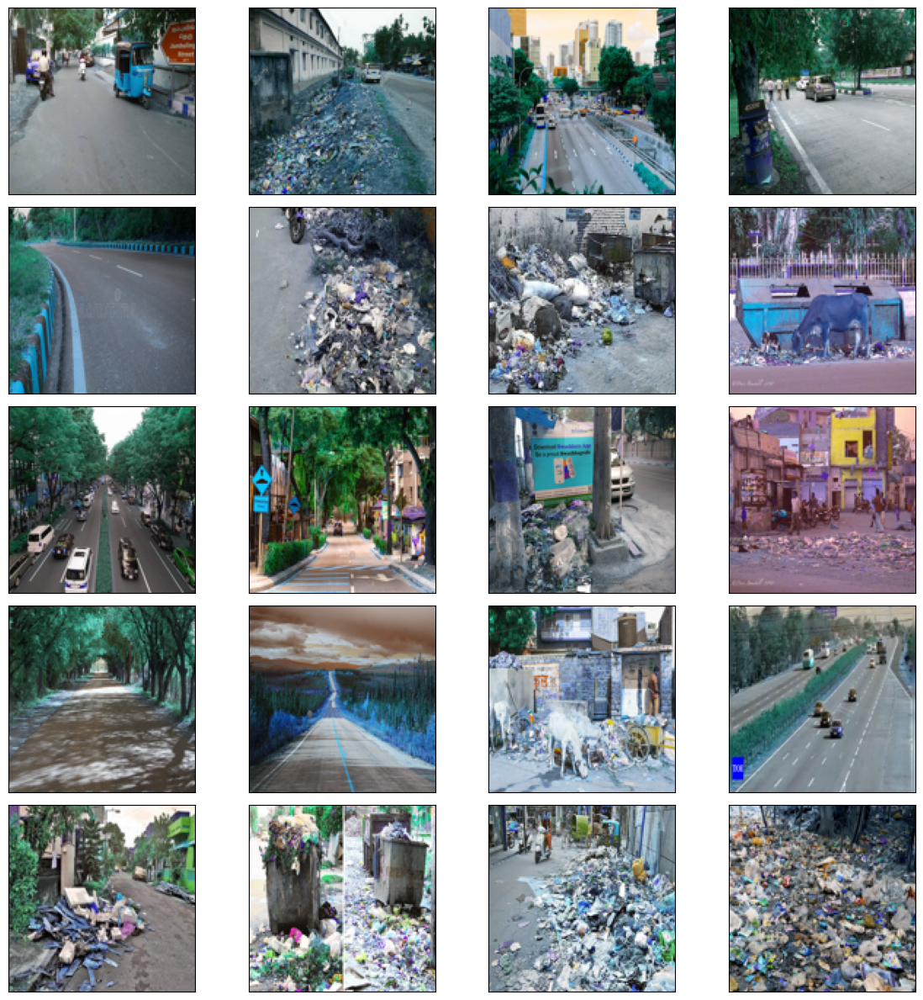

Overall accuracy: 0.0


In [298]:
# Debugging: Print class names and number of classes
print("Class Names:", class_names)
print("Number of classes:", len(class_names))

# Set up the figure and axes for a 5x4 grid
fig, axs = plt.subplots(5, 4, figsize=(12, 12))

# Counter for iterating through validation data
i = 0

# Initialize lists to store true and predicted labels
y_true = []
y_pred = []

for x in range(5):  # Loop through 5 rows
    for y in range(4):  # Loop through 4 columns
        # Predict the label for a single image
        input_image = X_val[i].reshape(1, 128, 128, 3) # Reshape to the original dimensions expected by the model
        prediction = model.predict(input_image, verbose=0)[0]

        axs[x][y].set_xticks([])
        axs[x][y].set_yticks([])

        # Debugging: Print the predicted and actual labels
        pred_class_index = np.argmax(prediction)
        true_class_index = np.argmax(y_val[i])
        print(f'Predicted Class Index: {pred_class_index}, True Class Index: {true_class_index}')

        # Append true and predicted labels to the respective lists
        y_true.append(true_class_index)
        y_pred.append(pred_class_index) # Append only the predicted class index

        # Compare predicted label with actual label
        if pred_class_index >= len(class_names) or true_class_index >= len(class_names):
            print(f"Index out of range: pred_class_index={pred_class_index}, true_class_index={true_class_index}")
        else:
            if pred_class_index != true_class_index:
                axs[x][y].set_xlabel(f'Prediction: {class_names[pred_class_index]} | Label: {class_names[true_class_index]}', color='red')
            else:
                axs[x][y].set_xlabel(f'Prediction: {class_names[pred_class_index]} | Label: {class_names[true_class_index]}')

        # Display the image in the grid
        axs[x][y].imshow(X_val[i])

        i += 1

# Display the plot
plt.tight_layout()
plt.show()

# Calculate the accuracy
from sklearn.metrics import accuracy_score # Import the accuracy_score function from sklearn.metrics
accuracy = accuracy_score(y_true, y_pred) # Calculate accuracy using the collected true and predicted labels
print("Overall accuracy:", accuracy)

In [256]:
print("Image shape:", demoImage.shape)


Image shape: (128, 128, 3)


Image pixel values are in the range [0, 1]. Scaling up for visualization...


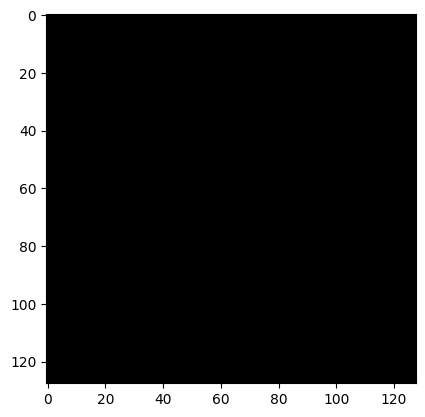

In [259]:
# Check if the image is already normalized to a range [0, 1]
# If so, we can scale it to [0, 255] for better visibility
if tf.reduce_max(demoImage_squeezed).numpy() <= 1.0: # Use .numpy() to extract the value from the EagerTensor
    print("Image pixel values are in the range [0, 1]. Scaling up for visualization...")
    demoImage_squeezed = demoImage_squeezed * 255.0  # Scale up pixel values

# Ensure values are within [0, 255] for display
demoImage_squeezed = tf.clip_by_value(demoImage_squeezed, 0, 255)

# Convert to a uint8 type (needed for proper visualization in matplotlib)
demoImage_squeezed = tf.cast(demoImage_squeezed, tf.uint8)

# Plot the image
plt.imshow(demoImage_squeezed)
plt.show()

Image shape for plotting: (128, 128, 3)


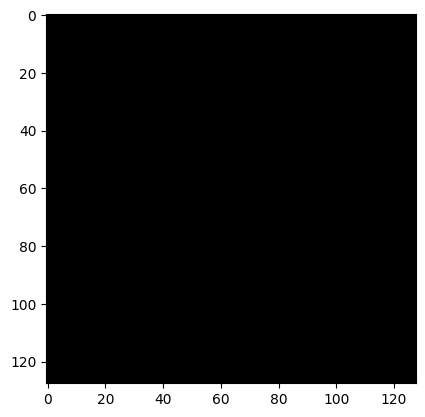

In [258]:
# Check if the image still has a batch dimension (shape like (1, height, width, channels))
# Use tf.squeeze() to remove any batch dimension
demoImage_squeezed = tf.squeeze(demoImage)  # This removes the batch dimension

# Now check the new shape to ensure it's valid for plotting (it should be (128, 128, 3))
print(f"Image shape for plotting: {demoImage_squeezed.shape}")

# Plot the image
plt.imshow(demoImage_squeezed)
plt.show()

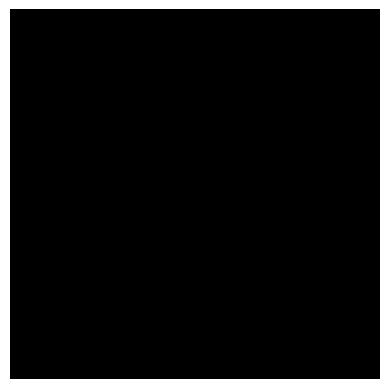

In [270]:
# Run model on the resized and normalized image
demoImage = tf.squeeze(demoImage)  # Remove the extra dimension
demoImage = tf.image.resize(demoImage, [224, 224])  # Resize to match model input
demoImage = tf.expand_dims(demoImage, axis=0)  # Add an extra dimension to represent a batch of size 1

# Run the model and get predictions
probabilities = tf.nn.softmax(model(demoImage, training=False)).numpy()

# Get the top 5 predictions
top_5 = tf.argsort(probabilities, axis=-1, direction="DESCENDING")[0][:5].numpy()

# Assuming 'classes' is a list or array of class names
np_classes = np.array(classes)

# Display the top 5 predictions with their probabilities
for i, item in enumerate(top_5):
    class_index = item  # item is already the index of the class
    class_name = np_classes[class_index]  # Access class name

    # Ensure class_name is a single string value
    if isinstance(class_name, np.ndarray):
        if class_name.size == 1:  # If it's an array of size 1, get the scalar value
            class_name = class_name.item()
        else:
            class_name = ", ".join(map(str, class_name))  # Join multiple elements into a single string
    else:
        class_name = str(class_name)  # Convert to string



# Display the image
plt.imshow(tf.squeeze(demoImage))
plt.axis('off')
plt.show()


(1) [[0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 2]
 [0 1 

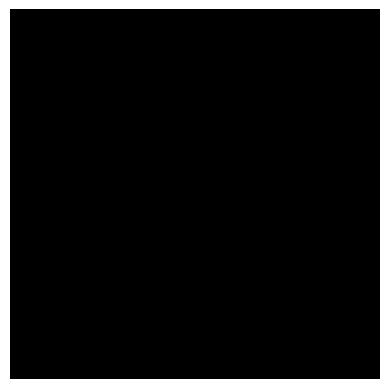

In [296]:
# Run model on the resized and normalized image
demoImage = tf.squeeze(demoImage)  # Remove the extra dimension
demoImage = tf.image.resize(demoImage, [224, 224])  # Resize to match model input
demoImage = tf.expand_dims(demoImage, axis=0)  # Add an extra dimension to represent a batch of size 1

# Run the model and get predictions
probabilities = tf.nn.softmax(model(demoImage, training=False)).numpy()

# Get the top 5 predictions
top_5 = tf.argsort(probabilities, axis=-1, direction="DESCENDING")[0][:5].numpy()

# Assuming 'classes' is a list or array of class names
np_classes = np.array(classes)

# Display the top 5 predictions with their probabilities
for i, item in enumerate(top_5):
    class_index = item  # item is already the index of the class
    class_name = np_classes[class_index]  # Access class name

    # Ensure class_name is a single string value
    if isinstance(class_name, np.ndarray):
        if class_name.size == 1:  # If it's an array of size 1, get the scalar value
            class_name = class_name.item()
        else:
            class_name = ", ".join(map(str, class_name))  # Join multiple elements into a single string
    else:
        class_name = str(class_name)  # Convert to string

    # Ensure probabilities value is a scalar or treat it as is
    probability = probabilities[0][class_index]

    # If probability is still an array, we take the first element or convert it
    if isinstance(probability, np.ndarray):
        probability = probability[0] if probability.size > 1 else probability.item()

    # Print the formatted line
    line = f'({i+1}) {class_index} - {class_name}: {probability}'
    print(line)

# Display the image
plt.imshow(tf.squeeze(demoImage))
plt.axis('off')
plt.show()


In [274]:
# Make a prediction for a single image
input_image = X_val[0].reshape(1, 128, 128, 3)  # Adjust input shape
prediction = model.predict(input_image, verbose=0)

# Debug: Print the shape of the prediction and the number of classes
print(f"Prediction shape: {prediction.shape}")
print(f"Number of output classes: {len(prediction[0])}")


Prediction shape: (1, 128, 128, 3)
Number of output classes: 128


In [295]:
# Ensure the input_image has the shape (1, 128, 128, 3)
input_image = X_val[0].reshape(1, 128, 128, 3)

# Predict the class probability for the input image
prediction = model.predict(input_image, verbose=0)

# Check the shape of the prediction (should typically be (1,) for binary classification)
print(f"Prediction shape: {prediction.shape}")

# If the prediction output is a multi-dimensional array, flatten it
if len(prediction.shape) > 1:
    prediction = prediction.flatten()

# Convert the probability to a binary class (0 or 1) using 0.5 as the threshold
pred_class = 1 if prediction[0] >= 0.5 else 0

# Get the true class label (assuming y_val is one-hot encoded or binary)
true_class = np.argmax(y_val[0]) if len(y_val[0]) > 1 else y_val[0]

print(f"Predicted class: {pred_class}, True class: {true_class}")


Prediction shape: (1, 128, 128, 3)
Predicted class: 0, True class: 1


In [294]:
# Example: Modify the model's output layer for multi-class classification
from tensorflow.keras import layers, models

# Assuming you have a model definition, modify the last layer like this:
num_classes = 3  # Update this based on the number of classes you have

model = models.Sequential([
    # ... (previous layers)
    layers.Dense(num_classes, activation='softmax')  # Softmax for multi-class classification
])

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])


In [293]:
# Iterate through the validation data and compare predictions to actual labels
for i in range(5):  # Just the first 5 examples for debugging
    input_image = X_val[i].reshape(1, 128, 128, 3)  # Reshape to model's expected input size
    prediction = model.predict(input_image, verbose=0)  # Get the predicted probability

    # Get the predicted class by finding the index with the highest probability
    pred_class = np.argmax(prediction)

    # Get the true label (assuming y_val is in one-hot encoded format)
    true_class = np.argmax(y_val[i])

    print(f"Image {i}: Predicted class: {pred_class}, True class: {true_class}")


Image 0: Predicted class: 0, True class: 1
Image 1: Predicted class: 0, True class: 1
Image 2: Predicted class: 0, True class: 1
Image 3: Predicted class: 0, True class: 0
Image 4: Predicted class: 0, True class: 0


In [290]:
num_classes = 2  # Update this based on the number of classes you have
# Recreate the model with the necessary layers
model = models.Sequential([
    # ... (previous layers) - Add the layers of your model here
    layers.Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 3)),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(128, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dense(num_classes, activation='sigmoid')  # Output layer with sigmoid for binary classification
])

# Compile the model
model.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])

# Run model on the image and get the probability
prediction = model.predict(input_image)[0][0]  # Get the probability

# Classify based on a threshold of 0.5
predicted_class = 1 if prediction >= 0.5 else 0

print(f"Predicted class: {predicted_class}")

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step
Predicted class: 0


In [291]:
# Run model on the image and get the probability
prediction = model.predict(input_image)[0][0]  # Get the probability

# Classify based on a threshold of 0.5
predicted_class = 1 if prediction >= 0.5 else 0

print(f"Predicted class: {predicted_class}")


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
Predicted class: 0


In [292]:
# Assuming this is a binary classification task
input_image = X_val[0].reshape(1, 128, 128, 3)  # Adjust input shape for the model
prediction = model.predict(input_image, verbose=0)

# Check if prediction is a single probability
print(f"Prediction: {prediction}")

# Access the probability for the positive class (index 0 for sigmoid)
pred_prob = prediction[0][0]

# Convert probability to a binary class (0 or 1)
pred_class = 1 if pred_prob >= 0.5 else 0

# Get the true class label
true_class = y_val[0]  # Assuming labels are 0 or 1

print(f"Predicted class: {pred_class}, True class: {true_class}")

Prediction: [[4.3116305e-13 9.2684759e-24]]
Predicted class: 0, True class: [0. 1.]


In [303]:
# Run model on the image and get the probability
prediction = model.predict(input_image)

# Print the shape of the prediction to understand the output
print(f"Shape of prediction: {prediction.shape}")

# Access the probability - Adjust indexing as needed based on the actual output and your desired prediction
prediction = prediction[0][0][0][0]

# Convert the probability to a binary class (0 or 1)
predicted_class = 1 if prediction >= 0.5 else 0

# Get the true class label
true_class = y_val[0]  # Assuming y_val contains binary labels (0 or 1)

print(f"Predicted class: {predicted_class}, True class: {true_class}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
Shape of prediction: (1, 128, 128, 3)
Predicted class: 0, True class: [0. 1.]


In [2]:
import pandas as pd
df = pd.DataFrame(fit_model.history)

df.insert(0,'Epoch',[x+1 for x in fit_model.epoch])
df.rename(columns={'accuracy':'Train_Acc','val_accuracy':'Test_Acc'}).plot(
    'Epoch',
     ['Train_Acc','Test_Acc'],
    grid=True,
    ylabel='Accuracy',
    title='Train and Test Accuracy',
    linewidth=8,
    figsize=(16,4));

NameError: name 'fit_model' is not defined

# Sources

- https://www.kaggle.com/code/crn4tww/clean-dirty-road-classification-accuracy-100
- https://www.kaggle.com/datasets/faizalkarim/cleandirty-road-classification
- https://www.kaggle.com/code/paultimothymooney/mobilenetv2-with-tensorflow